# `UTFVI` TensorFlow Decision Forests

In [254]:
ano = '2020'
md = '5'
folder = 'UHIn2m - speed + quad + RH'
feat = ['windspeed','windquad','RH']
t_index = 0

In [255]:
import tensorflow_decision_forests as tf
from tensorflow_decision_forests.tensorflow.core import Task

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, explained_variance_score, r2_score, precision_score, recall_score
from sklearn.metrics import classification_report, confusion_matrix, cohen_kappa_score, accuracy_score, roc_auc_score, roc_curve

# import Random Forest classifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import tree

import pandas as pd
from collections import defaultdict

import statsmodels.api as sm
import shap

import dtreeviz
import numpy as np
import matplotlib.pyplot as plt

import warnings

# Settings the warnings to be ignored
warnings.filterwarnings('ignore')
%config InlineBackend.figure_format = 'retina' # Make visualizations look good
#%config InlineBackend.figure_format = 'svg'
%matplotlib inline

random_state = 42 # get reproducible trees

## Load Sample Data

In [256]:
df = pd.read_csv('../era5_hourly_estacoes_cuiaba_'+ano+'_01-mensal.csv')
df = df[(df['UHIp2m']!='nenhum') & (df['UHIp2m']!='fraco') & (df['UHIp2m']!='medio')]

In [257]:
df[['Temp2m_mean', 'Temp2m', 'UHIp2m', 'UHIn2m','UTFVI2m','skinTemp_mean', 'skinTemp', 'UHIp', 'UHIn','UTFVI']]

,Temp2m_mean,Temp2m,UHIp2m,UHIn2m,UTFVI2m,skinTemp_mean,skinTemp,UHIp,UHIn,UTFVI
186,26.136355,26.545679,muito_forte,4.0,0.015420,23.138460,23.226526,fraco,1.0,0.003792
187,24.941902,25.506219,extremo,5.0,0.022125,22.347470,22.436670,fraco,1.0,0.003976
188,23.853408,24.122217,forte,3.0,0.011144,21.794030,21.881555,fraco,1.0,0.004000
351,28.590401,28.889398,forte,3.0,0.010350,30.496961,30.688806,medio,2.0,0.006251
1106,21.491849,21.713098,forte,3.0,0.010190,20.359242,20.588831,forte,3.0,0.011151
...,...,...,...,...,...,...,...,...,...,...
104478,26.379894,26.870782,muito_forte,4.0,0.018268,24.693771,24.754633,fraco,1.0,0.002459
104479,26.442272,26.868799,muito_forte,4.0,0.015874,22.763435,22.749017,nenhum,0.0,-0.000634
104498,20.037456,20.264063,forte,3.0,0.011183,18.692755,18.840875,medio,2.0,0.007862
104718,28.105162,28.492212,forte,3.0,0.013584,26.077044,26.024591,nenhum,0.0,-0.002016


In [258]:
df[(df['UHIp2m']=='muito_forte')]

,latitude,longitude,Day,Month,Year,hour,Temp2m,skinTemp,dewPoint,RH,...,date,timestamp,Cidade,Região,UF,UHIp,UHIn,UHIp2m,UHIn2m,local
186,-15.632077,-56.056664,1,5,2020,4,26.545679,23.226526,17.652155,0.479324,...,2020-05-01,2020-05-01 04:00:00,CUIABA,CO,MT,fraco,1.0,muito_forte,4.0,COXIPO
2013,-15.632077,-56.056664,15,9,2020,7,25.406519,22.880518,14.783105,0.466767,...,2020-09-15,2020-09-15 07:00:00,CUIABA,CO,MT,fraco,1.0,muito_forte,4.0,COXIPO
2015,-15.632077,-56.056664,15,9,2020,9,24.283929,22.145288,15.005426,0.475903,...,2020-09-15,2020-09-15 09:00:00,CUIABA,CO,MT,fraco,1.0,muito_forte,4.0,COXIPO
2258,-15.632077,-56.056664,16,8,2020,10,22.543542,20.548181,16.152612,0.496398,...,2020-08-16,2020-08-16 10:00:00,CUIABA,CO,MT,fraco,1.0,muito_forte,4.0,COXIPO
2279,-15.632077,-56.056664,16,8,2020,9,23.215356,21.025537,15.837274,0.489309,...,2020-08-16,2020-08-16 09:00:00,CUIABA,CO,MT,fraco,1.0,muito_forte,4.0,COXIPO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104232,-15.562907,-56.048130,7,9,2020,4,27.364648,24.686487,11.568750,0.432484,...,2020-09-07,2020-09-07 04:00:00,CUIABA,CO,MT,nenhum,0.0,muito_forte,4.0,MORADA_SERRAII
104429,-15.562907,-56.048130,8,5,2020,9,17.875909,14.980859,15.305597,0.524610,...,2020-05-08,2020-05-08 09:00:00,CUIABA,CO,MT,nenhum,0.0,muito_forte,4.0,MORADA_SERRAII
104446,-15.562907,-56.048130,8,6,2020,23,29.447595,27.821924,19.402307,0.472122,...,2020-06-08,2020-06-08 23:00:00,CUIABA,CO,MT,nenhum,0.0,muito_forte,4.0,MORADA_SERRAII
104478,-15.562907,-56.048130,8,8,2020,0,26.870782,24.754633,10.764063,0.430236,...,2020-08-08,2020-08-08 00:00:00,CUIABA,CO,MT,fraco,1.0,muito_forte,4.0,MORADA_SERRAII


In [259]:
df = df[df['UHIp2m']!='nenhum']

In [260]:
# ano = '2020'
mesInicial = 1
mesFinal = 3
# datei = ano+'-'+str(mesInicial)+'-23'
datei = str(int(ano)-1)+'-12'+'-21'
datef = ano+'-'+str(mesFinal)+'-21'
print(datei,datef)

2019-12-21 2020-3-21


In [261]:
df=df.drop_duplicates()

# Convert the date to datetime64
df['date'] = pd.to_datetime(df['date'], format='%Y-%m-%d')

In [262]:
df.loc[(df['Temp2m']>df['skinTemp']) & (df['hour']>=9) & (df['hour']<=15)][['date','hour','skinTemp','skinTemp_mean','UTFVI','UHIp','Temp2m','Temp2m_mean','UTFVI2m','UHIp2m','local']]

,date,hour,skinTemp,skinTemp_mean,UTFVI,UHIp,Temp2m,Temp2m_mean,UTFVI2m,UHIp2m,local
1106,2020-08-12,10,20.588831,20.359242,0.011151,forte,21.713098,21.491849,0.010190,forte,COXIPO
2015,2020-09-15,9,22.145288,22.086508,0.002654,fraco,24.283929,23.907853,0.015487,muito_forte,COXIPO
2258,2020-08-16,10,20.548181,20.514104,0.001658,fraco,22.543542,22.114880,0.019015,muito_forte,COXIPO
2279,2020-08-16,9,21.025537,20.989116,0.001732,fraco,23.215356,22.792266,0.018225,muito_forte,COXIPO
3338,2020-05-02,10,20.549921,20.390564,0.007755,medio,22.060327,21.829079,0.010483,forte,COXIPO
...,...,...,...,...,...,...,...,...,...,...,...
103904,2020-08-06,10,17.315210,17.019498,0.017078,muito_forte,19.267419,18.973008,0.015280,muito_forte,MORADA_SERRAII
103905,2020-08-06,11,18.363733,18.122053,0.013161,forte,19.850977,19.614674,0.011904,forte,MORADA_SERRAII
103925,2020-08-06,9,17.460901,17.158612,0.017312,muito_forte,19.475854,19.156631,0.016391,muito_forte,MORADA_SERRAII
104408,2020-05-08,10,14.741479,14.849682,-0.007340,nenhum,17.709253,17.485129,0.012656,forte,MORADA_SERRAII


In [263]:
# df_dif = df.loc[(df['Temp2m']>df['skinTemp'])][['date','hour','skinTemp','skinTemp_mean','UTFVI','UHIp','Temp2m','Temp2m_mean','UTFVI2m','UHIp2m','local']]

In [264]:
# df_dif[['Temp2m','skinTemp','date']].plot(x='date', y=['Temp2m'], kind='scatter', rot=90, c=df_dif['date'].dt.month, colormap='tab20', sharex=False);

In [265]:
# df_dif[['Temp2m','skinTemp','date']].plot(x='date', y=['skinTemp'], kind='scatter', rot=90, c=df_dif['date'].dt.month, colormap='tab20', sharex=False);

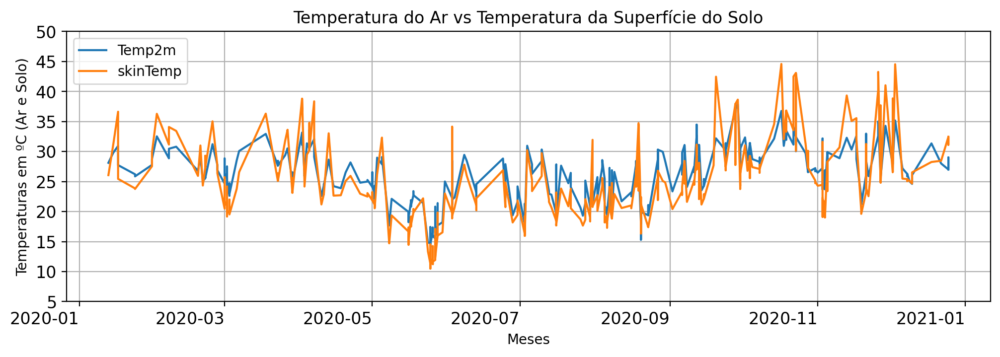

In [266]:
label = 'Meses'
res = df.plot(x='date', y=['Temp2m','skinTemp'], kind='line', rot=0, grid=True, ylim=(5, 50),
        title='Temperatura do Ar vs Temperatura da Superfície do Solo', xlabel=label, ylabel='Temperaturas em ºC (Ar e Solo)', fontsize=12, figsize=(12,4)).get_figure()

res.savefig("RF-IMAGES/classification/extremo/UTFVI2m/"+folder+"/"+"RF-Temp do Ar vs Temp do Solo-"+ano+".png")

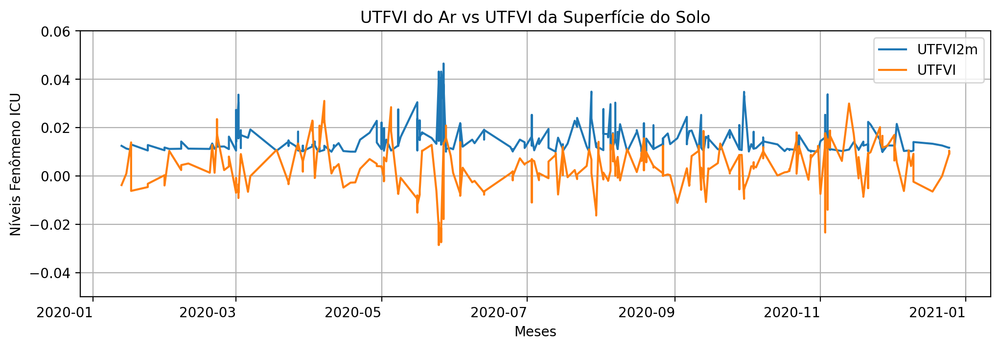

In [267]:
# df.plot(x='date', y=['UTFVI2m','UTFVI'], kind='line', rot=0, grid=True, title='UTFVI do Ar vs UTFVI da Superfície do Solo', xlabel=label,ylabel='Níveis Fenômeno ICU',fontsize=10, figsize=(12,4));
res = df.plot(x='date', y=['UTFVI2m','UTFVI'], kind='line',grid=True, ylim=(-0.05, 0.06), rot=0, title='UTFVI do Ar vs UTFVI da Superfície do Solo', xlabel=label,ylabel='Níveis Fenômeno ICU',fontsize=10, figsize=(12,4)).get_figure()

# Save figure
res.savefig("RF-IMAGES/classification/extremo/UTFVI2m/"+folder+"/"+"RF-UTFVI do Ar vs UTFVI-"+ano+".png")

In [268]:
df_UTFVI = df.loc[(df['UTFVI2m']>df['UTFVI'])][['date','hour','skinTemp','skinTemp_mean','UTFVI','UHIp','Temp2m','Temp2m_mean','UTFVI2m','UHIp2m','local']]
df_UTFVI

,date,hour,skinTemp,skinTemp_mean,UTFVI,UHIp,Temp2m,Temp2m_mean,UTFVI2m,UHIp2m,local
186,2020-05-01,4,23.226526,23.138460,0.003792,fraco,26.545679,26.136355,0.015420,muito_forte,COXIPO
187,2020-05-01,5,22.436670,22.347470,0.003976,fraco,25.506219,24.941902,0.022125,extremo,COXIPO
188,2020-05-01,6,21.881555,21.794030,0.004000,fraco,24.122217,23.853408,0.011144,forte,COXIPO
351,2020-11-10,22,30.688806,30.496961,0.006251,medio,28.889398,28.590401,0.010350,forte,COXIPO
1129,2020-09-12,1,27.017175,26.922808,0.003493,fraco,31.099268,30.734005,0.011745,forte,COXIPO
...,...,...,...,...,...,...,...,...,...,...,...
104478,2020-08-08,0,24.754633,24.693771,0.002459,fraco,26.870782,26.379894,0.018268,muito_forte,MORADA_SERRAII
104479,2020-08-08,1,22.749017,22.763435,-0.000634,nenhum,26.868799,26.442272,0.015874,muito_forte,MORADA_SERRAII
104498,2020-08-08,6,18.840875,18.692755,0.007862,medio,20.264063,20.037456,0.011183,forte,MORADA_SERRAII
104718,2020-06-09,0,26.024591,26.077044,-0.002016,nenhum,28.492212,28.105162,0.013584,forte,MORADA_SERRAII


In [269]:
def degToCompass(num):
    val=int((num/22.5)+.5)
    arr=["N","NNE","NE","ENE","L","ESE", "SE", "SSE","S","SSW","SW","WSW","O","WNW","NW","NNW"]
    print(arr[(val % 16)])

In [270]:
df["windspeed"] = df["windspeed"] * 3.6

In [271]:
df['UHIn2m'].value_counts()

3.0    1098
4.0     444
5.0     312
Name: UHIn2m, dtype: int64

In [272]:
power = {
     'baixo':0,
     'medio':1, 
     'alto':2,
}

df['windpower'] = df['windpower'].map(power) # re-mapping

In [273]:
def degrees_to_cardinal(d):
    '''
    note: this is highly approximate...
    '''
    dirs = np.array(["N", "NNE", "NE", "ENE", "L", "ESE", "SE", "SSE",
                     "S", "SSW", "SW", "WSW", "O", "WNW", "NW", "NNW"], dtype='U')
    ix = np.round(d / (360. / len(dirs))).astype('i')
    return dirs[ix % 16]

In [274]:
df['winddir_stat_name'] = degrees_to_cardinal(df['winddir']) #o "-1" é para evitar erro de acesso indevido à uma posição inexistente do array
df['winddir_stat'] = degrees_to_cardinal(df['winddir']) #o "-1" é para evitar erro de acesso indevido à uma posição inexistente do array
print(df[['winddir_stat','winddir']])
df["winddir_stat"] = df.winddir_stat.astype("category").cat.codes

       winddir_stat     winddir
186               L   81.930515
187               N  356.830737
188             NNW  330.052168
351             NNE   11.568357
1106              N    5.807925
...             ...         ...
104478          WSW  241.563662
104479            N  351.113576
104498           NE   35.502420
104718          ENE   71.861360
104767          NNW  336.898701

[1854 rows x 2 columns]


In [275]:
del df['date']
del df['longitude']
del df['latitude']
# del df['UHIp']
# del df['skinTemp']
# del df['Temp2m']
# del df['dewPoint']
# del df['total_precipitation']
del df['Day']
del df['Month']
del df['THI']
del df['UHI']
del df['HTI']
del df['Year']
del df['winddir']
del df['winddir_stat']
# del df['RH']
# del df['speed_x']
# del df['speed_y']
del df['Cidade']
del df['Região']
del df['UF']
# del df['total_evaporation']
# del df['windpower']
del df['timestamp']
del df['local']
# del df['UHIp2m']
del df['winddir_stat_name']
del df['skinTemp_mean']
del df['Temp2m_mean']
# del df['surface_pressure']
# del df['UHIn2m']
# del df['UTFVI2m']
del df['hour']

In [276]:
df['windquad'].value_counts()

1.0    399
2.0    369
8.0    294
5.0    246
7.0    174
3.0    141
4.0    129
6.0    102
Name: windquad, dtype: int64

In [277]:
quad = {
    1:'Primeiro',
    2:'Segundo', 
    3:'Terceiro',
    4:'Quarto',
    5:'Quinto',
    6:'Sexto',
    7:'Sétimo',
    8:'Oitavo'
}

df['windquad_cat'] = df['windquad'].map(quad) # re-mapping


In [278]:
df[['Temp2m','RH','windspeed','windquad','UHIp2m','UTFVI2m','windquad_cat']].to_csv('../random_forest/era5_2m_'+ano+'.csv')

In [279]:
quad = {
    1:0,
    2:1, 
    3:2,
    4:3,
    5:4,
    6:5,
    7:6,
    8:7
}

df['windquad'] = df['windquad'].map(quad) # re-mapping

In [280]:
df['windquad'] = df['windquad'].astype(int)

In [281]:
# df['UHIn2m'] = df['UHIn2m'].astype(int)
df['UHIn'] = df['UHIn'].astype(int)
# df['UHIn'] = df['UHIn'] -1 
df['UHIn'].value_counts()

1    480
0    447
2    396
3    342
4    141
5     48
Name: UHIn, dtype: int64

In [282]:
# df['UHIt'] = df['UHIn'].apply(lambda x: 1 if x >= 4 else 0)
df['UHIt'] = df['UHIn'].apply(lambda x: 2 if x >= 4 else ( 1 if (x >= 2 and x <= 3) else 0))

In [283]:
df['windquad_cat'].value_counts()

Primeiro    399
Segundo     369
Oitavo      294
Quinto      246
Sétimo      174
Terceiro    141
Quarto      129
Sexto       102
Name: windquad_cat, dtype: int64

# Classifiers

To demonstrate classifier decision trees, we trying to model using six features to predict the boolean survived target.

In [284]:
df

,Temp2m,skinTemp,dewPoint,RH,windspeed,surface_pressure,windquad,UTFVI,UTFVI2m,windpower,UHIp,UHIn,UHIp2m,UHIn2m,windquad_cat,UHIt
186,26.545679,23.226526,17.652155,0.479324,1.068544,993.40560,1,0.003792,0.015420,0,fraco,1,muito_forte,4.0,Segundo,0
187,25.506219,22.436670,17.826990,0.487734,2.281409,992.98280,7,0.003976,0.022125,0,fraco,1,extremo,5.0,Oitavo,0
188,24.122217,21.881555,18.104517,0.499535,3.428883,992.89625,7,0.004000,0.011144,0,fraco,1,forte,3.0,Oitavo,0
351,28.889398,30.688806,22.518701,0.498088,8.439759,987.05340,0,0.006251,0.010350,1,medio,2,forte,3.0,Primeiro,1
1106,21.713098,20.588831,12.689081,0.476950,7.387343,988207.00000,0,0.011151,0.010190,1,forte,3,forte,3.0,Primeiro,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104478,26.870782,24.754633,10.764063,0.430236,3.381679,995.39220,5,0.002459,0.018268,0,fraco,1,muito_forte,4.0,Sexto,0
104479,26.868799,22.749017,10.575861,0.429019,1.200613,995.93375,7,-0.000634,0.015874,0,nenhum,0,muito_forte,4.0,Oitavo,0
104498,20.264063,18.840875,11.883386,0.481187,7.375927,995.24590,0,0.007862,0.011183,1,medio,2,forte,3.0,Primeiro,1
104718,28.492212,26.024591,19.543848,0.479516,2.406328,991.18680,1,-0.002016,0.013584,0,nenhum,0,forte,3.0,Segundo,0


In [285]:
UTFVI_label = "UHIp2m"   # Name of the classification target label
classes = list(df[UTFVI_label].unique())
df[UTFVI_label] = df[UTFVI_label].map(classes.index)
print(f"Target '{UTFVI_label}'' classes: {classes}")

Target 'UHIp2m'' classes: ['muito_forte', 'extremo', 'forte']


In [286]:
X = df[feat]
y = df['UHIp2m']

In [287]:
features = feat
target = 'UHIp2m'
df[features + [target]]

,windspeed,windquad,RH,UHIp2m
186,1.068544,1,0.479324,0
187,2.281409,7,0.487734,1
188,3.428883,7,0.499535,2
351,8.439759,0,0.498088,2
1106,7.387343,0,0.476950,2
...,...,...,...,...
104478,3.381679,5,0.430236,0
104479,1.200613,7,0.429019,0
104498,7.375927,0,0.481187,2
104718,2.406328,1,0.479516,2


In [288]:
# features
dataset_tf = tf.keras.pd_dataframe_to_tf_dataset(df[features + [target]], label=target)
model = tf.keras.RandomForestModel(max_depth=int(md), random_seed = random_state, task=Task.CLASSIFICATION)
model.fit(dataset_tf)
model.compile(metrics = ["accuracy"])
ev = model.evaluate(dataset_tf)

Use /tmp/tmpswv8_t0x as temporary training directory
Reading training dataset...


2024-02-20 10:26:19.246764: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype double and shape [1854]
	 [[{{node Placeholder/_0}}]]


Training dataset read in 0:00:00.216869. Found 1854 examples.
Training model...
Model trained in 0:00:00.129179
Compiling model...
Model compiled.


[INFO 24-02-20 10:26:19.5641 -04 kernel.cc:1242] Loading model from path /tmp/tmpswv8_t0x/model/ with prefix 45787d6106e34589
[INFO 24-02-20 10:26:19.5868 -04 decision_forest.cc:660] Model loaded with 300 root(s), 8106 node(s), and 3 input feature(s).
[INFO 24-02-20 10:26:19.5868 -04 abstract_model.cc:1311] Engine "RandomForestGeneric" built
[INFO 24-02-20 10:26:19.5869 -04 kernel.cc:1074] Use fast generic engine
2024-02-20 10:26:19.601324: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_3' with dtype int64 and shape [1854]
	 [[{{node Placeholder/_3}}]]


2/2 [==============================] - 0s 16ms/step - loss: 0.0000e+00 - accuracy: 0.7055


In [289]:
print(f"BinaryCross Entropy Loss: {ev[0]}")
print(f"Accuracy: {ev[1]}")


BinaryCross Entropy Loss: 0.0
Accuracy: 0.7055016160011292


In [290]:
# import matplotlib.pyplot as plt
# logs = model.make_inspector().training_logs()
# plt.plot([log.num_trees for log in logs], [log.evaluation.accuracy for log in logs])
# plt.xlabel("Número de árvores (RF)")
# plt.ylabel("Acurácia - OOB (Out-of-bag)")
# plt.show()

## Initialize dtreeviz model (adaptor)

To adapt dtreeviz to a specific model, use the `model()` function to get an adaptor.  You'll need to provide the model, X/y data, feature names, target name, and target class names:

In [291]:
# model.summary()

In [292]:
# model.make_inspector().variable_importances()

In [293]:
# inspector = model.make_inspector()
# print("Model type:", inspector.model_type())
# print("Number of trees:", inspector.num_trees())
# print("Objective:", inspector.objective())
# print("Input features:", inspector.features())

In [294]:
viz_model = dtreeviz.model(model, 
                           tree_index=t_index,
                           X_train=df[features],
                           y_train=df[target],
                           feature_names=features,
                           target_name='Fenômeno ICU',
                           class_names=classes)

We'll use this model to demonstrate dtreeviz functionality in the following sections; the code will look the same for any decision tree library once we have this model adaptor.

## Tree structure visualizations
To show the decision tree structure using the default visualization, call `view()`:

In [295]:
v = viz_model.view(scale=2.1)
v.save("RF-IMAGES/classification/extremo/UTFVI2m/"+folder+"/"+"RF-UHIn x ALL-MD"+md+"-"+ano+".svg")

To change the visualization, you can pass parameters, such as changing the orientation to left-to-right:

In [127]:
# v = viz_model.view(orientation="LR",scale=2.1)
# v.save("RF-IMAGES/classification/extremo/UTFVI2m/"+folder+"/"+"RF-UHIn x ALL-LR-MD"+md+"-"+ano+".svg")

To visualize larger trees, you can reduce the amount of detail by turning off the fancy view:

In [44]:
# viz_model.view(fancy=False)

Another way to reduce the visualization size is to specify the tree depths of interest:

In [45]:
# v = viz_model.view(depth_range_to_display=(1, 2)) # root is level 0
# v.save("RF-IMAGES/classification/extremo/UTFVI2m/"+folder+"/"+"RF - UHIn - classification-MD"+md+"-range-"+ano+".svg")

## Prediction path explanations

For interpretation purposes, we often want to understand how a tree behaves for a specific instance. Let's pick a specific instance:

In [46]:
x = df[features].iloc[np.random.randint(0, len(df)),:].values

and then display the path through the tree structure:

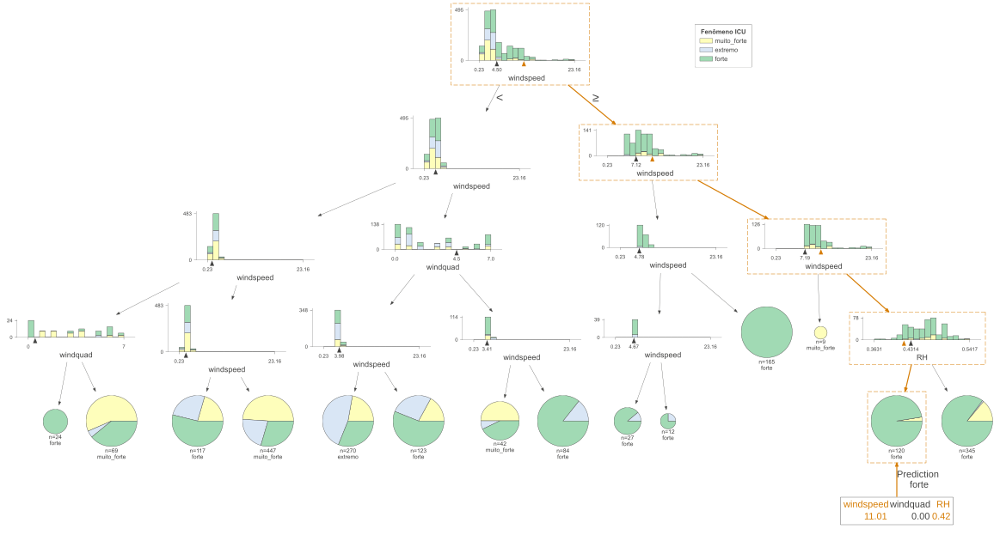

In [47]:
viz_model.view(x=x)
# v = viz_model.view(x=x)
# v.save("RF-IMAGES/classification/extremo/UTFVI2m/"+folder+"/"+"RF - UHIn - classification-MD"+md+"-predict-"+ano+".svg")

In [48]:
# v = viz_model.view(x=x, show_just_path=True)
# v.save("RF-IMAGES/classification/extremo/UTFVI2m/"+folder+"/"+"RF - UHIn - classification-MD"+md+"-path-"+ano+".svg")

You can also get a string representation explaining the comparisons made as an instance is run down the tree:

In [49]:
print(viz_model.explain_prediction_path(x))

7.19 <= windspeed 
RH < 0.43



# `Features` Importance

In [50]:
# # let's create a dictionary of features and their importance values
# feat_dict= {}
# for col, val in sorted(zip(X_train.columns, dt_hp.feature_importances_),key=lambda x:x[1],reverse=True):
#   feat_dict[col]=val

## Leaf info

There are a number of functions to get information about the leaves of the tree.

In [51]:
# viz_model.leaf_sizes()

In [52]:
# viz_model.ctree_leaf_distributions()

In [53]:
# viz_model.node_stats(node_id=4)

In [54]:
# v = viz_model.ctree_feature_space(features=['windspeed'], show={'splits','legend'}, figsize=(10,5))

In [55]:
# viz_model.ctree_feature_space(nbins=40, 
#                               gtype='barstacked', 
#                               show={'splits','title'}, 
#                               features=['windspeed','RH'],
#                               figsize=(10,5))

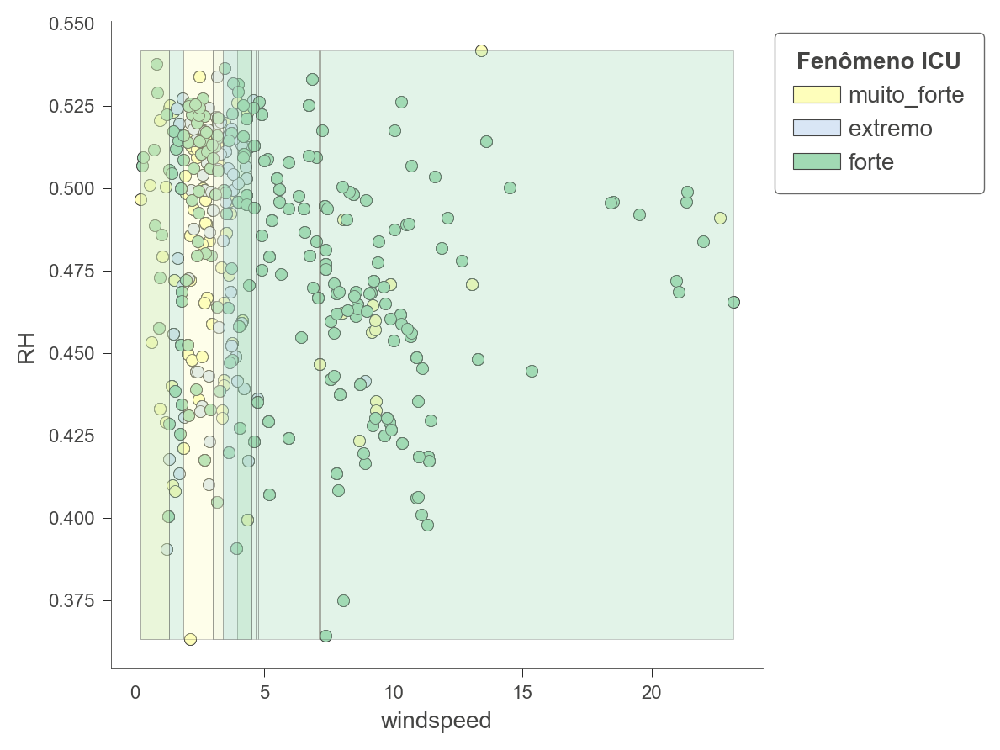

In [56]:
viz_model.ctree_feature_space(features=['windspeed','RH'], show={'splits','legend'}, figsize=(5,5))

In [57]:
# print(f"Available variable importances:")
# for importance in inspector.variable_importances().keys():
#   print("\t", importance)

In [58]:
# import matplotlib.pyplot as plt

# plt.figure(figsize=(12, 4))

# # Mean decrease in AUC of the class 1 vs the others.
# variable_importance_metric = "INV_MEAN_MIN_DEPTH"
# variable_importances = inspector.variable_importances()[variable_importance_metric]

# # Extract the feature name and importance values.
# #
# # `variable_importances` is a list of <feature, importance> tuples.
# feature_names = [vi[0].name for vi in variable_importances]
# feature_importances = [vi[1] for vi in variable_importances]
# # The feature are ordered in decreasing importance value.
# feature_ranks = range(len(feature_names))

# bar = plt.barh(feature_ranks, feature_importances, label=[str(x) for x in feature_ranks])
# plt.yticks(feature_ranks, feature_names)
# plt.gca().invert_yaxis()

# # TODO: Replace with "plt.bar_label()" when available.
# # Label each bar with values
# for importance, patch in zip(feature_importances, bar.patches):
#   plt.text(patch.get_x() + patch.get_width(), patch.get_y(), f"{importance:.4f}", va="top")

# plt.xlabel(variable_importance_metric)
# plt.title("Mean decrease in AUC of the class 1 vs the others")
# plt.tight_layout()
# plt.show()

In [59]:
# viz_model.instance_feature_importance(x, figsize=(3.5,2))

# Inspect Individual Trees

In [60]:
# first_tree = inspector.extract_tree(tree_idx=5)
# print(first_tree.pretty())

In [61]:
import math
model.compile(metrics=["mse"])
evaluation = model.evaluate(dataset_tf, return_dict=True)

print(evaluation)
print()
print(f"MSE: {evaluation['mse']}")
print(f"RMSE: {math.sqrt(evaluation['mse'])}")

2/2 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - mse: 1.8776
{'loss': 0.0, 'mse': 1.8775581121444702}

MSE: 1.8775581121444702
RMSE: 1.370240165863076


In [62]:
inspector = model.make_inspector()
print("Model type:", inspector.model_type())
print("Number of trees:", inspector.num_trees())
print("Objective:", inspector.objective())
print("Input features:", inspector.features())

Model type: RANDOM_FOREST
Number of trees: 300
Objective: Classification(label=__LABEL, class=None, num_classes=3)
Input features: ["RH" (1; #0), "windquad" (1; #2), "windspeed" (1; #3)]


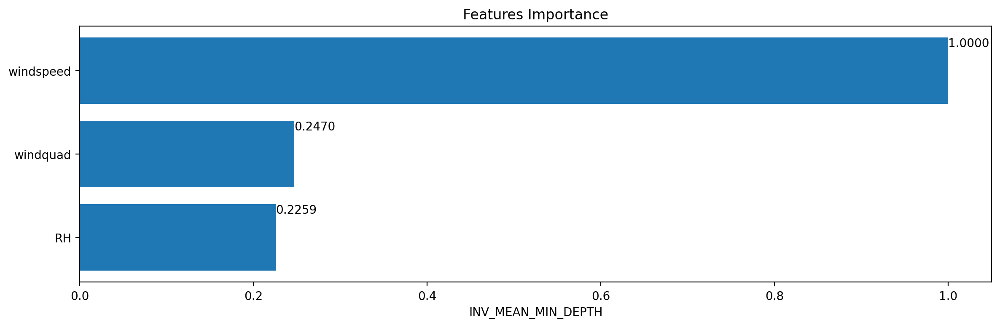

In [63]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))

# Mean decrease in AUC of the class 1 vs the others.
variable_importance_metric = "INV_MEAN_MIN_DEPTH"
variable_importances = inspector.variable_importances()[variable_importance_metric]

# Extract the feature name and importance values.
#
# `variable_importances` is a list of <feature, importance> tuples.
feature_names = [vi[0].name for vi in variable_importances]
feature_importances = [vi[1] for vi in variable_importances]
# The feature are ordered in decreasing importance value.
feature_ranks = range(len(feature_names))

bar = plt.barh(feature_ranks, feature_importances, label=[str(x) for x in feature_ranks])
plt.yticks(feature_ranks, feature_names)
plt.gca().invert_yaxis()

# TODO: Replace with "plt.bar_label()" when available.
# Label each bar with values
for importance, patch in zip(feature_importances, bar.patches):
  plt.text(patch.get_x() + patch.get_width(), patch.get_y(), f"{importance:.4f}", va="top")

plt.xlabel(variable_importance_metric)
plt.title("Features Importance")
plt.tight_layout()
plt.show()

In [41]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 42)

In [42]:
# import Random Forest classifier
from sklearn.ensemble import RandomForestClassifier

# instantiate the classifier 
rf = RandomForestClassifier(random_state=42)

# fit the model
rf.fit(X_train, y_train)

# Predict the Test set results
y_pred = rf.predict(X_test)

# Check accuracy score 
from sklearn.metrics import accuracy_score

print('Model accuracy score with 10 decision-trees : {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

Model accuracy score with 10 decision-trees : 0.9785


In [43]:
sensitivity = recall_score(True , y_pred)
specificity = recall_score(np.logical_not(True) , np.logical_not(y_pred))	

TypeError: Expected sequence or array-like, got <class 'bool'>

In [66]:
#HABILITAR SOMENTE PARA ENCONTRAR OS MELHORES PARÂMETROS
from sklearn.model_selection import GridSearchCV
param_grid = { 
    'n_estimators': [200, 300, 500],
    'max_features': ['sqrt', 'log2'],
    'max_depth' : [4,5,6,7,8],
    'criterion' :['gini', 'entropy']
}


In [67]:
confusion_matrix(y_test, y_pred)

array([[146,   3,   3],
       [  0,  92,   0],
       [  3,   3, 307]])

In [68]:
cohen_kappa_score(y_test, y_pred)

0.9631847098675332

In [69]:
# CV_rfc = GridSearchCV(estimator=rf, param_grid=param_grid, cv= 5)

In [70]:
# CV_rfc.fit(X_train, y_train)

In [71]:
# print(CV_rfc.cv_results_)

In [72]:
# print(CV_rfc.best_params_)

In [73]:
# print(CV_rfc.best_estimator_)

In [74]:
rfc1=RandomForestClassifier(random_state=random_state, max_features='sqrt', n_estimators= 500, max_depth=8, criterion='gini')

In [75]:
rfc1.fit(X_train, y_train)

RandomForestClassifier(max_depth=8, n_estimators=500, random_state=42)

In [76]:
pred=rfc1.predict(X_test)
print("Accuracy for Random Forest on CV data: ",accuracy_score(y_test,pred))

Accuracy for Random Forest on CV data:  0.9210053859964094


In [77]:
def plot_search_results(grid):
    """
    Params: 
        grid: A trained GridSearchCV object.
    """
    ## Results from grid search
    results = grid.cv_results_
    means_test = results['mean_test_score']
    stds_test = results['std_test_score']
    means_train = results['mean_score_time']
    stds_train = results['std_score_time']

    ## Getting indexes of values per hyper-parameter
    masks=[]
    masks_names= list(grid.best_params_.keys())
    for p_k, p_v in grid.best_params_.items():
        masks.append(list(results['param_'+p_k].data==p_v))

    params=grid.param_grid

    ## Ploting results
    fig, ax = plt.subplots(1,len(params),sharex='none', sharey='all',figsize=(20,5))
    fig.suptitle('Score per parameter')
    fig.text(0.04, 0.5, 'MEAN SCORE', va='center', rotation='vertical')
    pram_preformace_in_best = {}
    for i, p in enumerate(masks_names):
        m = np.stack(masks[:i] + masks[i+1:])
        pram_preformace_in_best
        best_parms_mask = m.all(axis=0)
        best_index = np.where(best_parms_mask)[0]
        x = np.array(params[p])
        y_1 = np.array(means_test[best_index])
        e_1 = np.array(stds_test[best_index])
        y_2 = np.array(means_train[best_index])
        e_2 = np.array(stds_train[best_index])
        ax[i].errorbar(x, y_1, e_1, linestyle='--', marker='o', label='test')
        ax[i].errorbar(x, y_2, e_2, linestyle='-', marker='^',label='train' )
        ax[i].set_xlabel(p.upper())

    plt.legend()
    plt.show()

In [78]:
# plot_search_results(CV_rfc)

In [79]:
import seaborn as sns
import pandas as pd

def plot_cv_results(cv_results, param_x, param_z, metric='rank_test_score'):
    """
    cv_results - cv_results_ attribute of a GridSearchCV instance (or similar)
    param_x - name of grid search parameter to plot on x axis
    param_z - name of grid search parameter to plot by line color
    """
    cv_results = pd.DataFrame(cv_results)
    col_x = 'param_' + param_x
    col_z = 'param_' + param_z
    fig, ax = plt.subplots(1, 1, figsize=(11, 8))
    sns.pointplot(x=col_x, y=metric, hue=col_z, data=cv_results, errorbar=('ci', 99), n_boot=64, ax=ax)
    ax.set_title("CV Grid Search Results")
    ax.set_xlabel(param_x)
    ax.set_ylabel(metric)
    ax.legend(title=param_z)
    return fig

In [80]:
# fig = plot_cv_results(CV_rfc.cv_results_, 'max_features', 'max_features')

In [81]:
# Calling Method 
# plot_grid_search(CV_rfc.cv_results_, ['300','500'], ['sqrt', 'log2'], 'N Estimators', 'Max Features')

In [82]:
from sklearn.model_selection import RandomizedSearchCV
rf_RandomGrid = RandomizedSearchCV(estimator = rf, param_distributions = param_grid, cv = 10, verbose=2, n_jobs = 4)

In [83]:
rf_RandomGrid.fit(X_train, y_train)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


RandomizedSearchCV(cv=10, estimator=RandomForestClassifier(random_state=42),
                   n_jobs=4,
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': [4, 5, 6, 7, 8],
                                        'max_features': ['sqrt', 'log2'],
                                        'n_estimators': [200, 300, 500]},
                   verbose=2)

In [84]:
# print (f'Train Accuracy - : {CV_rfc.score(X_train,y_train):.3f}')
# print (f'Test Accuracy - : {CV_rfc.score(X_test,y_test):.3f}')

In [85]:
print (f'Train Accuracy - : {rf_RandomGrid.score(X_train,y_train):.3f}')
print (f'Test Accuracy - : {rf_RandomGrid.score(X_test,y_test):.3f}')

Train Accuracy - : 0.969
Test Accuracy - : 0.921


In [86]:
rf_RandomGrid.best_params_

{'n_estimators': 300,
 'max_features': 'log2',
 'max_depth': 8,
 'criterion': 'gini'}

In [87]:
rf_RandomGrid.best_estimator_

RandomForestClassifier(max_depth=8, max_features='log2', n_estimators=300,
                       random_state=42)

In [88]:
# instantiate the classifier with n_estimators = 100
rfc_100 = RandomForestClassifier(n_estimators=100, random_state=42)

# fit the model to the training set
rfc_100.fit(X_train, y_train)

# Predict on the test set results
y_pred_100 = rfc_100.predict(X_test)

# Check accuracy score 
print('Model accuracy score with 100 decision-trees : {0:0.4f}'. format(accuracy_score(y_test, y_pred_100)))

Model accuracy score with 100 decision-trees : 0.9785


In [89]:
pred=rfc1.predict(X_test)
print("Accuracy for Random Forest on CV data: {0:0.4f} ".format(accuracy_score(y_test,pred)))

Accuracy for Random Forest on CV data: 0.9210 


In [90]:
# view the feature scores
feature_scores = pd.Series(rfc1.feature_importances_, index=X_train.columns).sort_values(ascending=False)
feature_scores

windspeed    0.551613
RH           0.318510
windquad     0.129877
dtype: float64

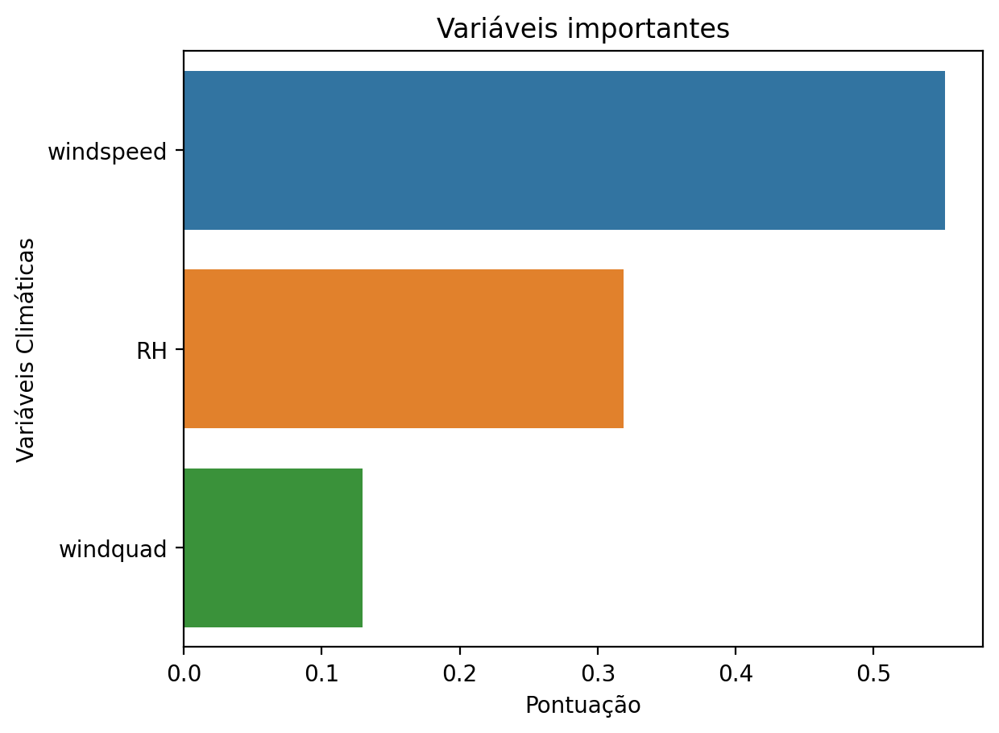

In [91]:
# import seaborn as sns
# import matplotlib.pyplot as plt
# Creating a seaborn bar plot
sns.barplot(x=feature_scores, y=feature_scores.index)

# Add labels to the graph
plt.xlabel('Pontuação')
plt.ylabel('Variáveis Climáticas')
# Add title to the graph
plt.title("Variáveis importantes")

# Visualize the graph
plt.show()

In [92]:
# split data into training and testing sets

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 42)

In [93]:
# instantiate the classifier with n_estimators = 100
clf = RandomForestClassifier(random_state=random_state)

# fit the model to the training set
clf.fit(X_train, y_train)

# Predict on the test set results
y_pred = clf.predict(X_test)

# Check accuracy score 
print('Model accuracy score with doors variable removed : {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

Model accuracy score with doors variable removed : 0.9785


In [94]:
cohen_kappa_score(y_test, y_pred)

0.9631847098675332

In [95]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.98      0.96      0.97       152
           1       0.94      1.00      0.97        92
           2       0.99      0.98      0.99       313

    accuracy                           0.98       557
   macro avg       0.97      0.98      0.97       557
weighted avg       0.98      0.98      0.98       557



In [96]:
from sklearn.ensemble import RandomForestClassifier # from xgboost import XGBClassifier
model = RandomForestClassifier() # XGBClassifier()
model.fit(X, y)
pd.DataFrame({'Variable':X.columns,'Importance':model.feature_importances_}).sort_values('Importance', ascending=False)

,Variable,Importance
0,windspeed,0.519205
2,RH,0.367680
1,windquad,0.113115


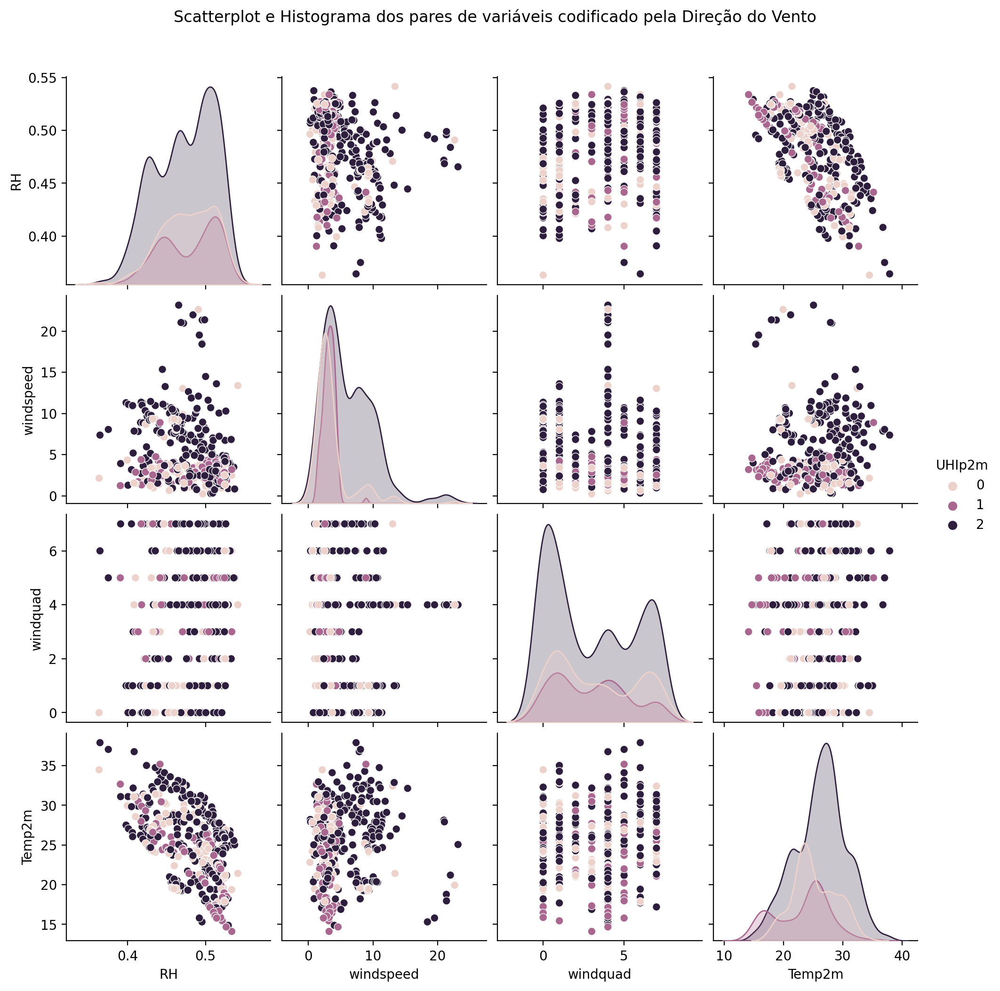

In [97]:
g = sns.pairplot(df[['UHIp2m','RH','windspeed','windquad','Temp2m']], hue='UHIp2m')
g.fig.suptitle("Scatterplot e Histograma dos pares de variáveis codificado pela Direção do Vento",y=1.05);

In [98]:
X = df[feat] #drop(['windquad','windquad_cat','dewPoint','surface_pressure','skinTemp','UTFVI','windpower' ,axis=1)
y = df['UHIp2m']
X,y

(        windspeed  windquad        RH
 186      1.068544         1  0.479324
 187      2.281409         7  0.487734
 188      3.428883         7  0.499535
 351      8.439759         0  0.498088
 1106     7.387343         0  0.476950
 ...           ...       ...       ...
 104478   3.381679         5  0.430236
 104479   1.200613         7  0.429019
 104498   7.375927         0  0.481187
 104718   2.406328         1  0.479516
 104767   2.537714         7  0.432214
 
 [1854 rows x 3 columns],
 186       0
 187       1
 188       2
 351       2
 1106      2
          ..
 104478    0
 104479    0
 104498    2
 104718    2
 104767    1
 Name: UHIp2m, Length: 1854, dtype: int64)

In [99]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
model = RandomForestClassifier(n_estimators=500, max_depth=int(md), max_features='sqrt', random_state=random_state, criterion='gini', oob_score=True, bootstrap=True)
# Fit RandomForestClassifier
rfc = model.fit(X_train, y_train)
# Predict the test set labels
# y_pred = rfc.predict(X_test)
print('o R² do treino é: %.2f'% rfc.score(X_train, y_train))

o R² do treino é: 0.84


In [100]:
# from sklearn.base import clone
# scores = []
# for i in range(50):
#     this_rf = clone(rfc)
#     this_rf.estimators_ = rfc.estimators_[:i]
#     this_rf.n_classes_ = [rfc.n_classes_]
#     this_rf.n_outputs_ = rfc.n_outputs_
#     this_rf._set_oob_score(X, y.reshape(-1, 1))
#     scores.append(this_rf.oob_score_)

In [101]:
#prediction of the training data
ytrain_pred = rfc.predict(X_train)
print('Mean Absolute Error: %.2f'% mean_absolute_error(y_train, ytrain_pred))
print('Mean Squared Error: %.2f'% mean_squared_error(y_train, ytrain_pred))
print('Root Mean Squared Error: %.2f'% np.sqrt(mean_squared_error(y_train, ytrain_pred)))
print('Explained Variance Score: %.2f'% explained_variance_score(y_train, ytrain_pred))

Mean Absolute Error: 0.24
Mean Squared Error: 0.40
Root Mean Squared Error: 0.63
Explained Variance Score: 0.44


In [102]:
#Prediction on the testing data
ytest_pred = rfc.predict(X_test)
#the testing coef of determination
print('O R² do Teste é: %.2f'% r2_score(y_test, ytest_pred))
print('O R² do Teste é: %.2f'% rfc.score(X_test, y_test))

O R² do Teste é: 0.28
O R² do Teste é: 0.79


In [103]:
# print('Mean Absolute Error: %.2f'% mean_absolute_error(y_test, y_pred))
# print('Mean Squared Error: %.2f'% mean_squared_error(y_test, y_pred))
# print('Root Mean Squared Error: %.2f'% np.sqrt(mean_squared_error(y_test, y_pred)))
# print('Explained Variance Score: %.2f'% explained_variance_score(y_test, y_pred))

In [104]:
print('Mean Absolute Error: %.2f'% mean_absolute_error(y_test, ytest_pred))
print('Mean Squared Error: %.2f'% mean_squared_error(y_test, ytest_pred))
print('Root Mean Squared Error: %.2f'% np.sqrt(mean_squared_error(y_test, ytest_pred)))
print('Explained Variance Score: %.2f'% explained_variance_score(y_test, ytest_pred))

Mean Absolute Error: 0.32
Mean Squared Error: 0.54
Root Mean Squared Error: 0.74
Explained Variance Score: 0.32


In [105]:
print('Score: ', rfc.score(X_train, y_train))  
# Obtain the OOB error
oob_error = 1 - rfc.oob_score_
  
# Print the OOB error
print(f'OOB error: {rfc.oob_score_:.3f}')

# from sklearn import metrics
# pred_train = np.argmax(rfc.oob_decision_function_,axis=1)
# metrics.roc_auc_score(y_train, pred_train)

Score:  0.8419429452582884
OOB error: 0.767


In [106]:
from sklearn.metrics import r2_score
def print_rf_scores(fitted_model):
    """Generates RMSE and R^2 scores from fitted Random Forest model."""

    yhat_train = fitted_model.predict(X_train)
    R2_train = fitted_model.score(X_train, y_train)
    yhat_valid = fitted_model.predict(X_valid)
    R2_valid = fitted_model.score(X_valid, y_valid)

    scores = {
        "RMSE on train:": rmse(y_train, yhat_train),
        "R^2 on train:": R2_train,
        "RMSE on valid:": rmse(y_valid, yhat_valid),
        "R^2 on valid:": R2_valid,
    }
    if hasattr(fitted_model, "oob_score_"):
        scores["OOB R^2:"] = fitted_model.oob_score_

    for score_name, score_value in scores.items():
        print(score_name, round(score_value, 3))


In [107]:
# print_rf_scores(model)

In [108]:
# n_estimators = 500

# for i in range(1, n_estimators + 1):
#     model.set_params(n_estimators=i)
#     model.fit(X, y)
#     print (i, model.oob_score_)
# plot(model.oob_score_)

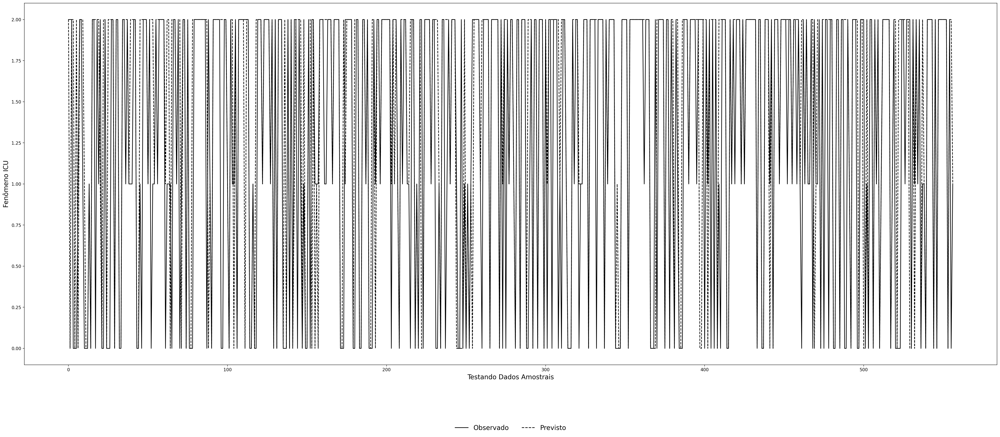

In [109]:
# Plotting the observed and predicted data
import matplotlib.pyplot as plt
# Setting the boundaries and parameters
plt.rcParams['figure.figsize'] = (40,15)
x_ax = range(len(X_test))
# Plotting
plt.plot(x_ax, y_test, label='Observado', color = 'k', linestyle = '-')
plt.plot(x_ax, ytest_pred, label = 'Previsto', color = 'k', linestyle = '--')
plt.ylabel('Fenômeno ICU', fontsize=15)
plt.xlabel('Testando Dados Amostrais',fontsize=15)
plt.legend(bbox_to_anchor = (0.5, -0.2), loc = 'lower center', ncol = 2, frameon =
False,fontsize=15)
# plt.show()
plt.savefig("RF-IMAGES/classification/extremo/UTFVI2m/"+folder+"/"+"RF-WINDQUADxall-MD"+str(md)+"-"+ano+".png")

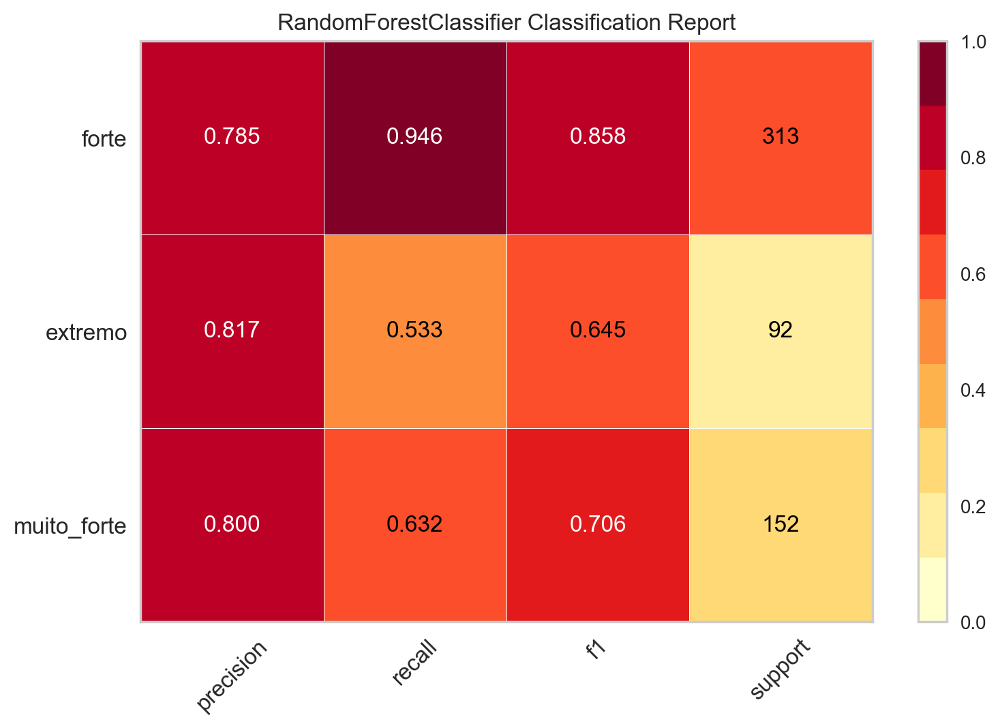

<AxesSubplot: title={'center': 'RandomForestClassifier Classification Report'}>

In [110]:
#Plotting the classification errors and residuals
# Setting the boundaries and parameters
plt.rcParams['figure.figsize'] = (7,4)
from yellowbrick.classifier import ClassificationReport
visualizer = ClassificationReport(rfc,classes=classes, support=True)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.poof()

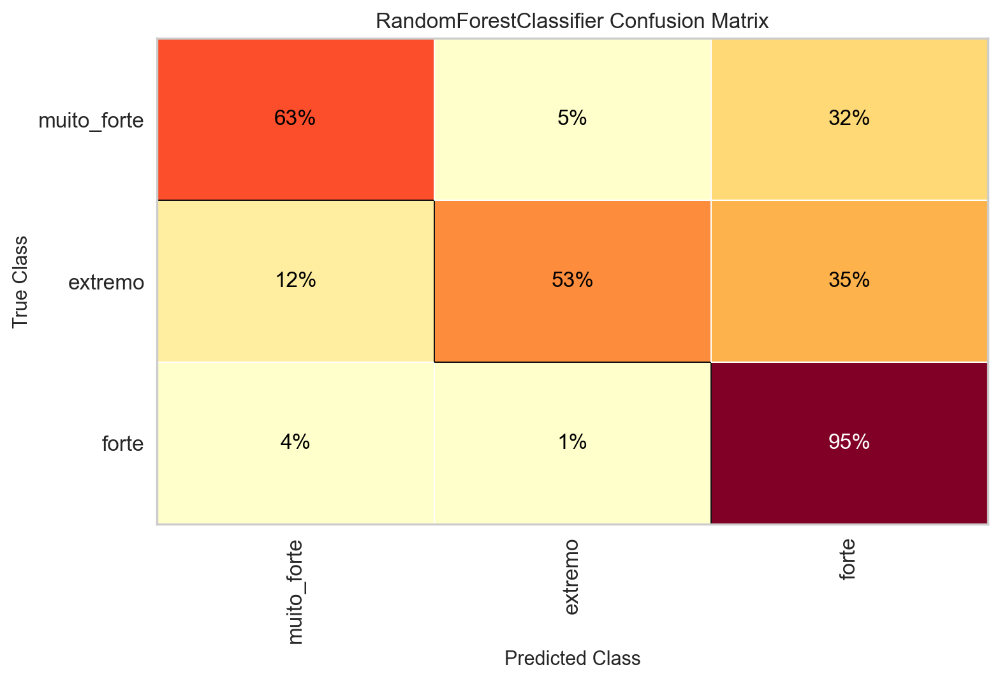

In [111]:
from yellowbrick.classifier import ConfusionMatrix
cm = ConfusionMatrix( rfc, 
                     classes=classes, 
                     percent=True
                     #label_encoder={0: 'Forte', 1: 'Muito Forte', 2: 'Extremo'}
)
cm.fit(X_train, y_train)
cm.score(X_test, y_test)
cm.show();

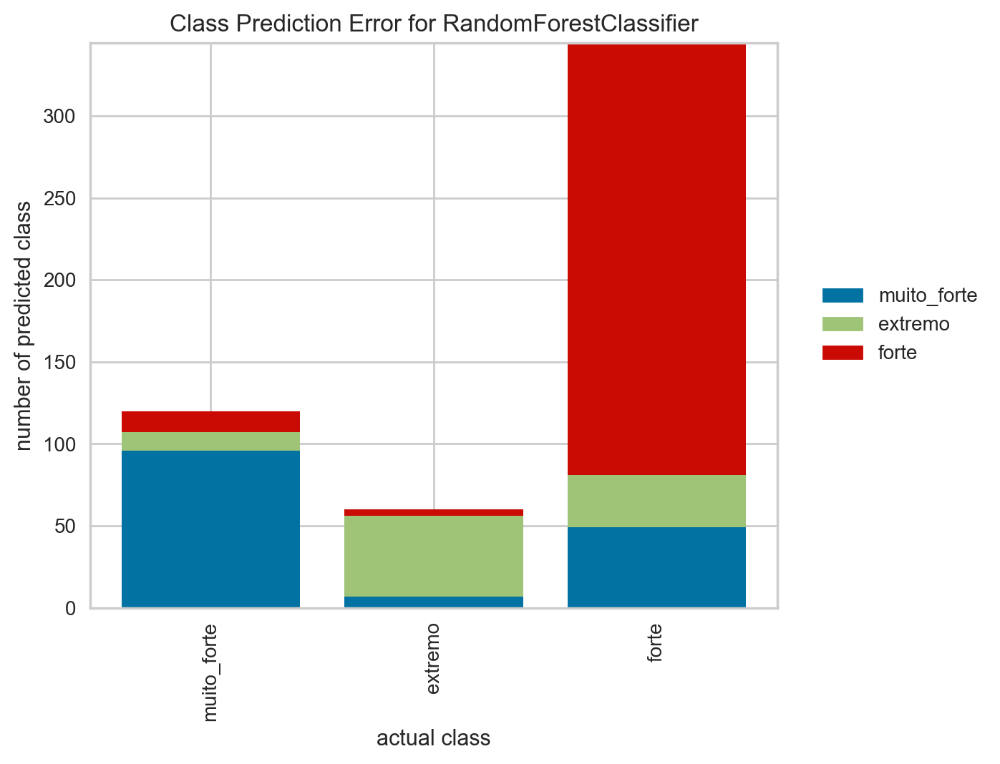

In [112]:
from yellowbrick.classifier import ClassPredictionError
visualizer = ClassPredictionError(rfc, classes=classes)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.show();

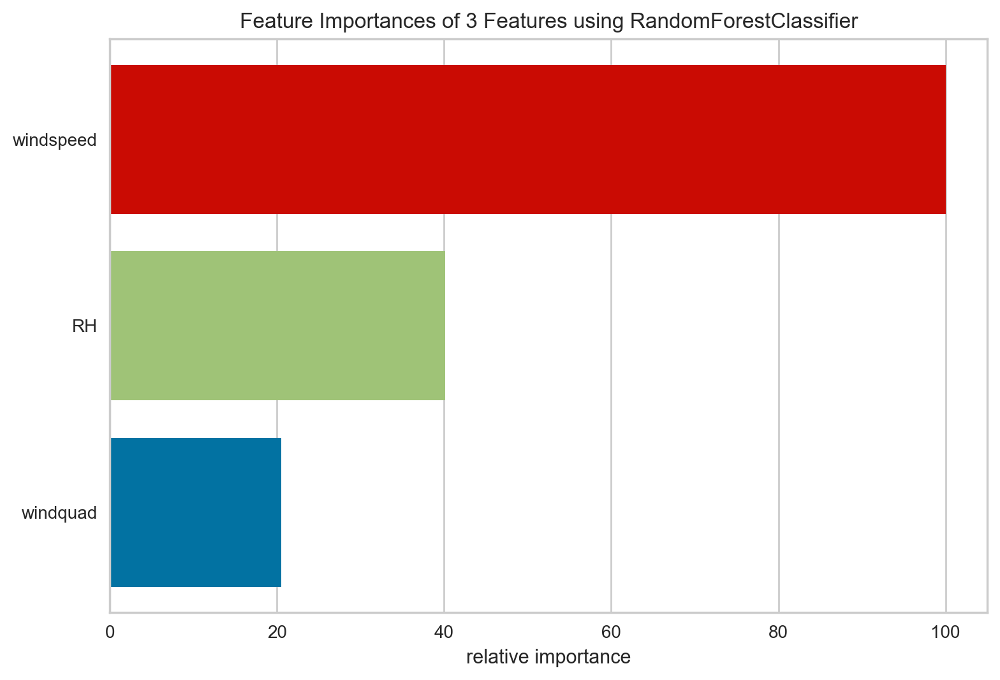

In [113]:
from yellowbrick.model_selection import FeatureImportances
from sklearn.ensemble import RandomForestClassifier
visualizer = FeatureImportances(rfc)
visualizer.fit(X_train, y_train)
visualizer.show();

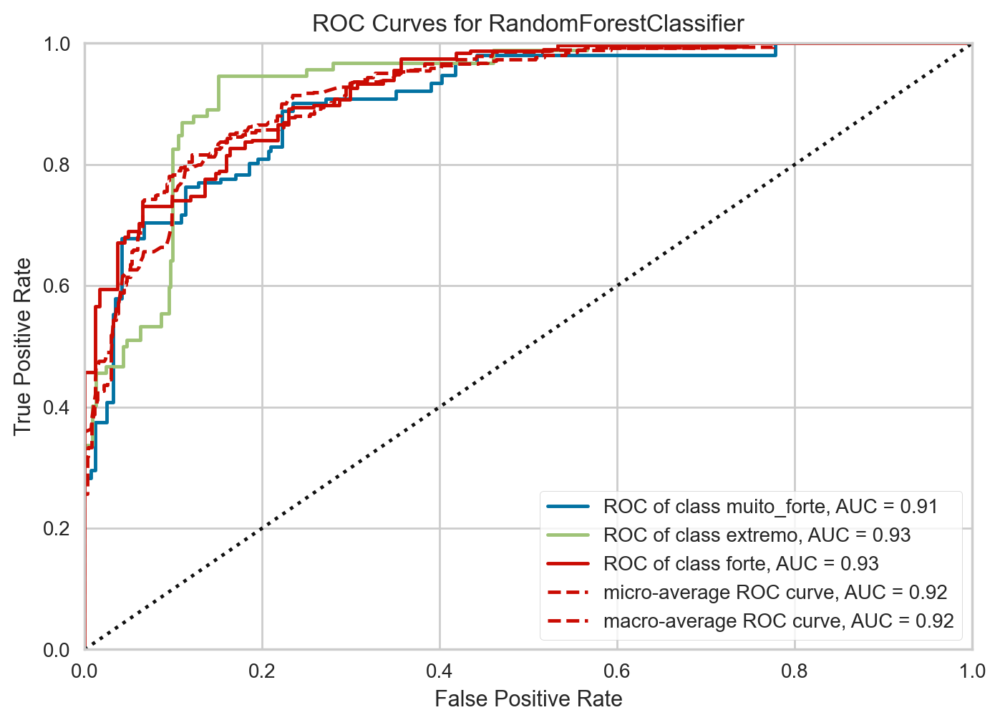

In [114]:
from yellowbrick.classifier import ROCAUC
# from sklearn.linear_model import LogisticRegression
# X, y = load_spam()
# X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y)
# model = LogisticRegression(max_iter=10000)
# model.fit(X_train, y_train)
visualizer = ROCAUC(rfc, classes = classes) #['Segundo', 'Oitavo', 'Primeiro', 'Sétimo', 'Terceiro', 'Quarto', 'Quinto', 'Sexto'])
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.show();

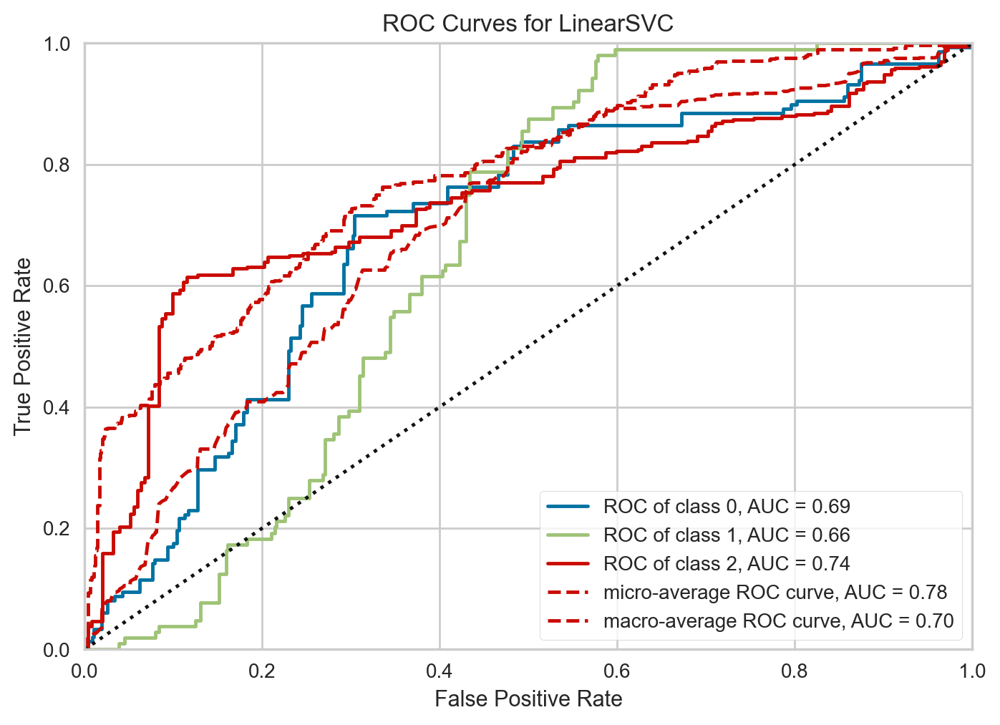

<AxesSubplot: title={'center': 'ROC Curves for LinearSVC'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [115]:
from sklearn.svm import LinearSVC
from yellowbrick.classifier import ROCAUC
model = LinearSVC()
visualizer = ROCAUC(model)
visualizer.fit(X,y)
visualizer.score(X,y)
visualizer.show()

              precision    recall  f1-score   support

           0       0.98      0.96      0.97       152
           1       0.94      1.00      0.97        92
           2       0.99      0.98      0.99       313

    accuracy                           0.98       557
   macro avg       0.97      0.98      0.97       557
weighted avg       0.98      0.98      0.98       557



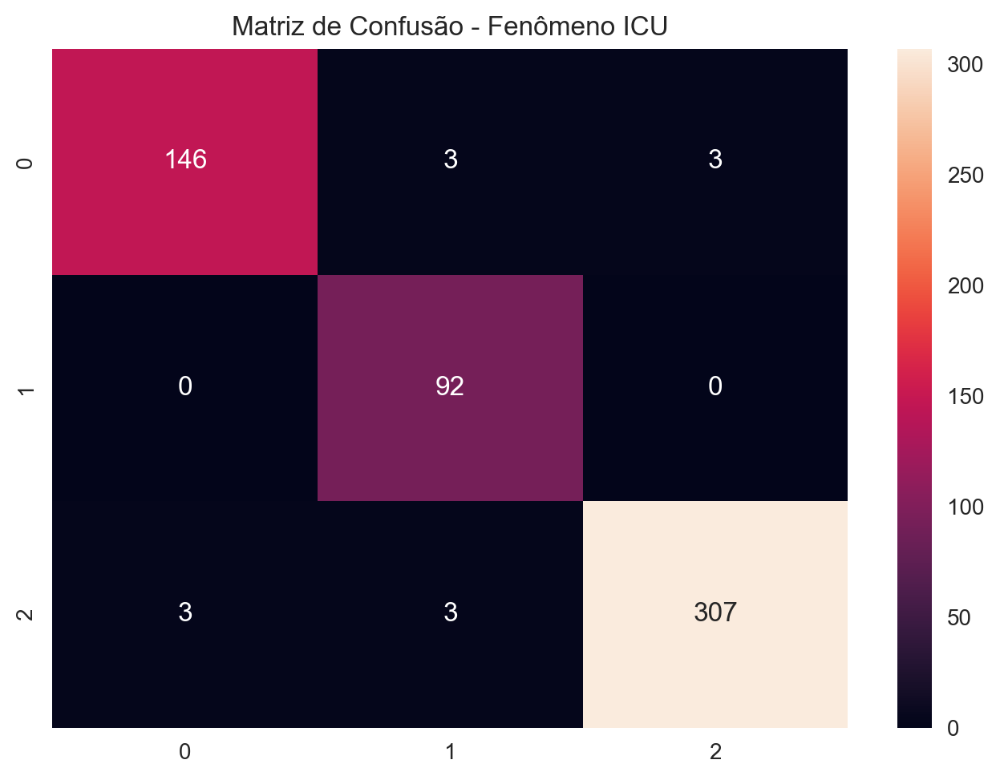

In [116]:
from sklearn.metrics import classification_report, confusion_matrix
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d').set_title('Matriz de Confusão - Fenômeno ICU')
print(classification_report(y_test,y_pred))

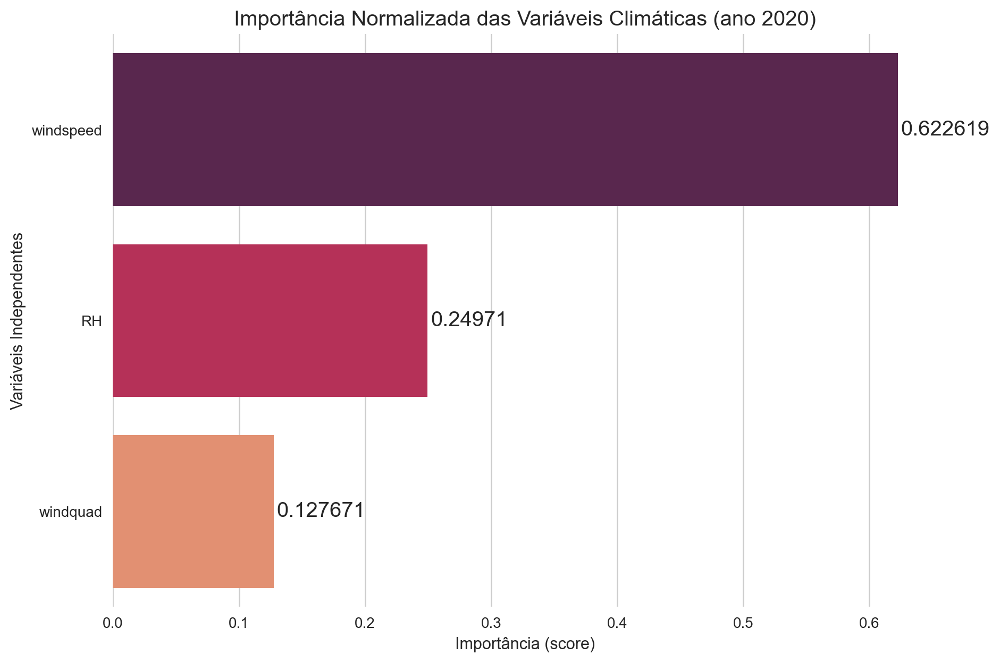

In [117]:
# # Organizing feature names and importances in a DataFrame
# features_df = pd.DataFrame({'features': rfc.feature_names_in_, 'importances': rfc.feature_importances_ })
# # Sorting data from highest to lowest
# features_df_sorted = features_df.sort_values(by='importances', ascending=False)
# # Barplot of the result without borders and axis lines
# g = sns.barplot(data=features_df_sorted, x='importances', y ='features', palette="rocket")
# sns.despine(bottom = True, left = True)
# g.set_title('Importância das Variáveis Climáticas')
# g.set(xlabel=None)
# g.set(ylabel=None)
# g.set(xticks=[])
# for value in g.containers:
#     g.bar_label(value, padding=2)
# plt.savefig("RF-IMAGES/classification/extremo/UTFVI2m/"+folder+"/"+"RF-Importance_Features-"+ano+".png")
plt.rcParams['figure.figsize'] = (10,7)
# Organizing feature names and importances in a DataFrame
features_df = pd.DataFrame({'features': rfc.feature_names_in_, 'importances': rfc.feature_importances_ })
# Sorting data from highest to lowest
features_df_sorted = features_df.sort_values(by='importances', ascending=False)
# Barplot of the result without borders and axis lines
g = sns.barplot(data=features_df_sorted, x='importances', y ='features', palette="rocket")
sns.despine(bottom = True, left = True)
sns.set(font_scale=1.2)
g.set_title('Importância Normalizada das Variáveis Climáticas (ano '+ano+')')
g.set(xlabel='Importância (score)')
g.set(ylabel='Variáveis Independentes')
# g.set(xticks=[])
for value in g.containers:
    g.bar_label(value, padding=2)
plt.savefig("RF-IMAGES/classification/extremo/UTFVI2m/"+folder+"/"+"RF-Importance_Features-"+ano+".png")

In [118]:
rfc_ = RandomForestClassifier(n_estimators=500, max_depth=int(md), max_features='sqrt', random_state=random_state, criterion='gini')

rfc_.fit(X_train, y_train)
y_pred = rfc_.predict(X_test)

In [119]:
# Predict class labels on training data
pred_labels_tr = rfc_.predict(X_train)
# Predict class labels on a test data
pred_labels_te = rfc_.predict(X_test)

In [120]:
print('*************** Evaluation on Test Data ***************')
score_te = rfc_.score(X_test, y_test)
print('Accuracy Score: ', score_te)
# Look at classification report to evaluate the model
print(classification_report(y_test, pred_labels_te))

*************** Evaluation on Test Data ***************
Accuracy Score:  0.7917414721723519
              precision    recall  f1-score   support

           0       0.80      0.63      0.71       152
           1       0.82      0.53      0.64        92
           2       0.79      0.95      0.86       313

    accuracy                           0.79       557
   macro avg       0.80      0.70      0.74       557
weighted avg       0.79      0.79      0.78       557



In [121]:
print('*************** Evaluation on Train Data ***************')
score_tr = rfc_.score(X_train, y_train)
print('Accuracy Score: ', score_tr)
# Look at classification report to evaluate the model
print(classification_report(y_train, pred_labels_tr))

*************** Evaluation on Train Data ***************
Accuracy Score:  0.8419429452582884
              precision    recall  f1-score   support

           0       0.79      0.72      0.75       292
           1       0.93      0.58      0.72       220
           2       0.85      0.96      0.90       785

    accuracy                           0.84      1297
   macro avg       0.85      0.75      0.79      1297
weighted avg       0.85      0.84      0.83      1297



In [122]:
print(classification_report(y_test, pred_labels_te))

              precision    recall  f1-score   support

           0       0.80      0.63      0.71       152
           1       0.82      0.53      0.64        92
           2       0.79      0.95      0.86       313

    accuracy                           0.79       557
   macro avg       0.80      0.70      0.74       557
weighted avg       0.79      0.79      0.78       557



In [123]:
print(classification_report(y_train, pred_labels_tr))

              precision    recall  f1-score   support

           0       0.79      0.72      0.75       292
           1       0.93      0.58      0.72       220
           2       0.85      0.96      0.90       785

    accuracy                           0.84      1297
   macro avg       0.85      0.75      0.79      1297
weighted avg       0.85      0.84      0.83      1297



In [124]:
regc = rfc_.fit(X_train, y_train)
print('o R² do treino é: %.2f'% regc.score(X_train, y_train))

o R² do treino é: 0.84


In [125]:
regc = rfc_.fit(X_test, y_test)
print('o R² do teste é: %.2f'% regc.score(X_test, y_test))

o R² do teste é: 0.83


              precision    recall  f1-score   support

           0       0.80      0.63      0.71       152
           1       0.82      0.53      0.64        92
           2       0.79      0.95      0.86       313

    accuracy                           0.79       557
   macro avg       0.80      0.70      0.74       557
weighted avg       0.79      0.79      0.78       557



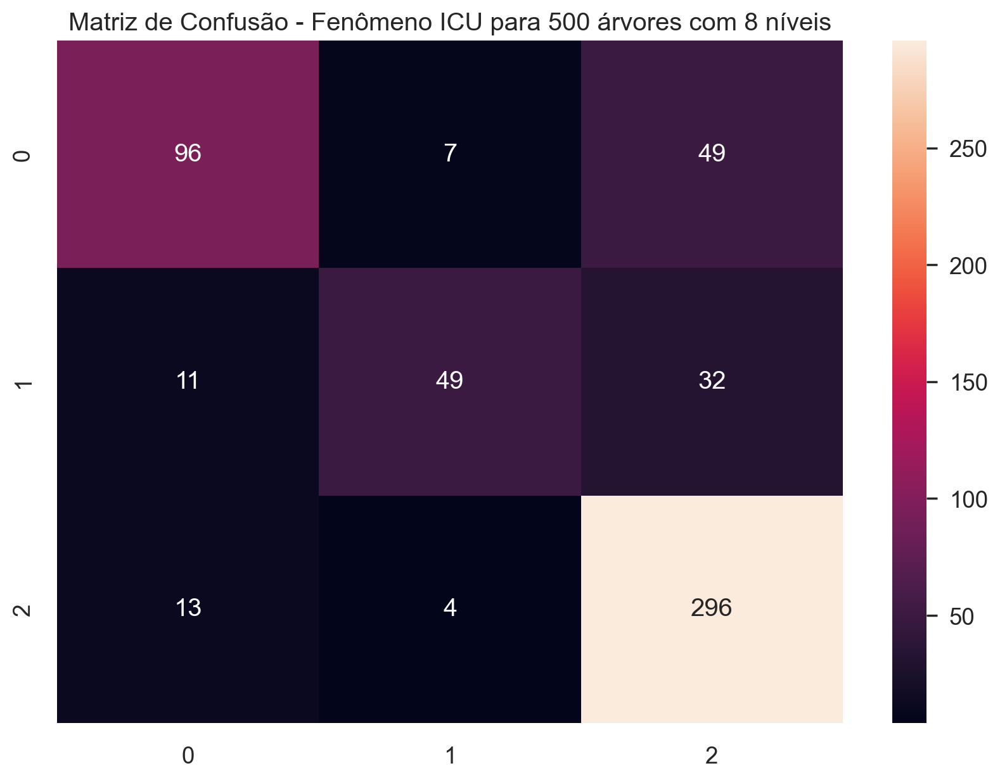

In [126]:
cm_ = confusion_matrix(y_test, y_pred)
sns.heatmap(cm_, annot=True, fmt='d').set_title('Matriz de Confusão - Fenômeno ICU para 500 árvores com 8 níveis')
print(classification_report(y_test,y_pred))

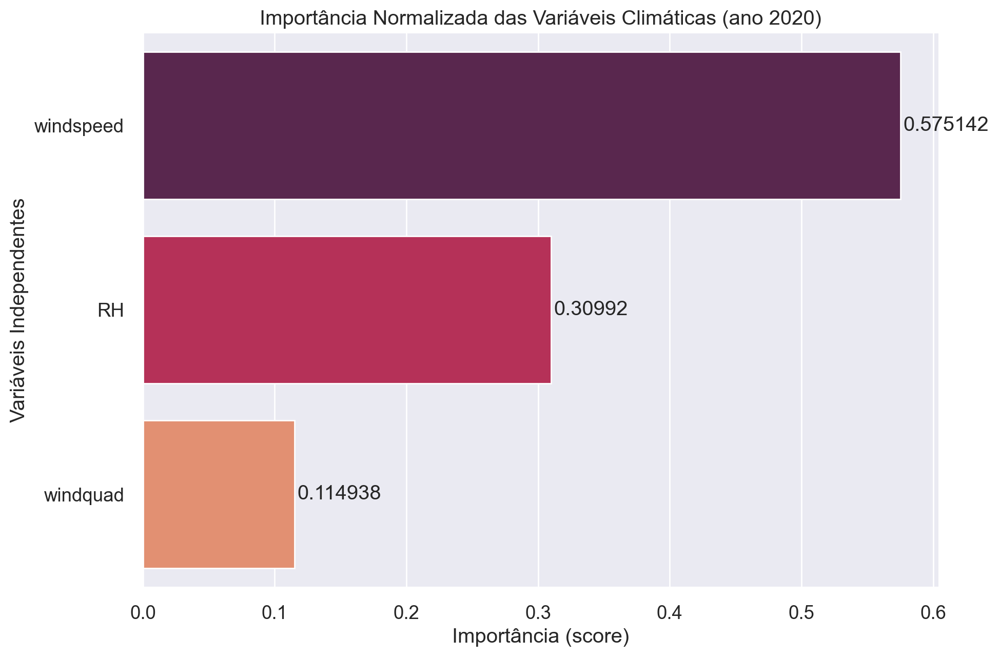

In [127]:
plt.rcParams['figure.figsize'] = (10,7)
# Organizing feature names and importances in a DataFrame
features_df = pd.DataFrame({'features': rfc_.feature_names_in_, 'importances': rfc_.feature_importances_ })
# Sorting data from highest to lowest
features_df_sorted = features_df.sort_values(by='importances', ascending=False)
# Barplot of the result without borders and axis lines
g = sns.barplot(data=features_df_sorted, x='importances', y ='features', palette="rocket")
sns.despine(bottom = True, left = True)
g.set_title('Importância Normalizada das Variáveis Climáticas (ano '+ano+')')
g.set(xlabel='Importância (score)')
g.set(ylabel='Variáveis Independentes')
# g.set(xticks=[])
for value in g.containers:
    g.bar_label(value, padding=2)
# plt.savefig("RF-IMAGES/classification/extremo/UTFVI2m/"+folder+"/"+"RF-Importances_Features-"+ano+".png")

In [128]:
y = df[target]
X = df[feat] #.drop(['UHIn','UTFVI2m','dewPoint','surface_pressure','windquad_cat','skinTemp','UTFVI','windpower'], axis=1)
y

186       0
187       1
188       2
351       2
1106      2
         ..
104478    0
104479    0
104498    2
104718    2
104767    1
Name: UHIp2m, Length: 1854, dtype: int64

In [129]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=random_state)

In [130]:
from sklearn.ensemble import RandomForestRegressor
model = RandomForestRegressor(n_estimators=500, 
                              max_depth=int(md), 
                              random_state=random_state,
                              max_features='log2',
                              criterion='poisson')
# rfr.fit(X_train, y_train)
# y_pred = rfr.predict(X_test)

In [131]:
reg = model.fit(X_train, y_train)
print('o R² do treino é: %.2f'% reg.score(X_train, y_train))

o R² do treino é: 0.46


In [132]:
ytrain_pred = reg.predict(X_train)
y_pred = reg.predict(X_test)
print('Mean Absolute Error: %.2f'% mean_absolute_error(y_train, ytrain_pred))
print('Mean Squared Error: %.2f'% mean_squared_error(y_train, ytrain_pred))
print('Root Mean Squared Error: %.2f'% np.sqrt(mean_squared_error(y_train, ytrain_pred)))
print('Explained Variance Score: %.2f'% explained_variance_score(y_train, ytrain_pred))

Mean Absolute Error: 0.48
Mean Squared Error: 0.37
Root Mean Squared Error: 0.61
Explained Variance Score: 0.46


In [133]:
#Prediction on the testing data
ytest_pred = reg.predict(X_test)
#the testing coef of determination
print('O R² do Teste é: %.2f'% r2_score(y_test, ytest_pred))
print('O R² do Teste é: %.2f'% reg.score(X_test, y_test))

O R² do Teste é: 0.41
O R² do Teste é: 0.41


In [134]:
# Model Metrics
#MAE
print('Mean Absolute Error: %.2f'% mean_absolute_error(y_test, ytest_pred))
print('Mean Squared Error: %.2f'% mean_squared_error(y_test, ytest_pred))
print('Root Mean Squared Error: %.2f'% np.sqrt(mean_squared_error(y_test,ytest_pred)))
print('Explained Variance Score: %.2f'% explained_variance_score(y_test,ytest_pred))

Mean Absolute Error: 0.54
Mean Squared Error: 0.44
Root Mean Squared Error: 0.67
Explained Variance Score: 0.41


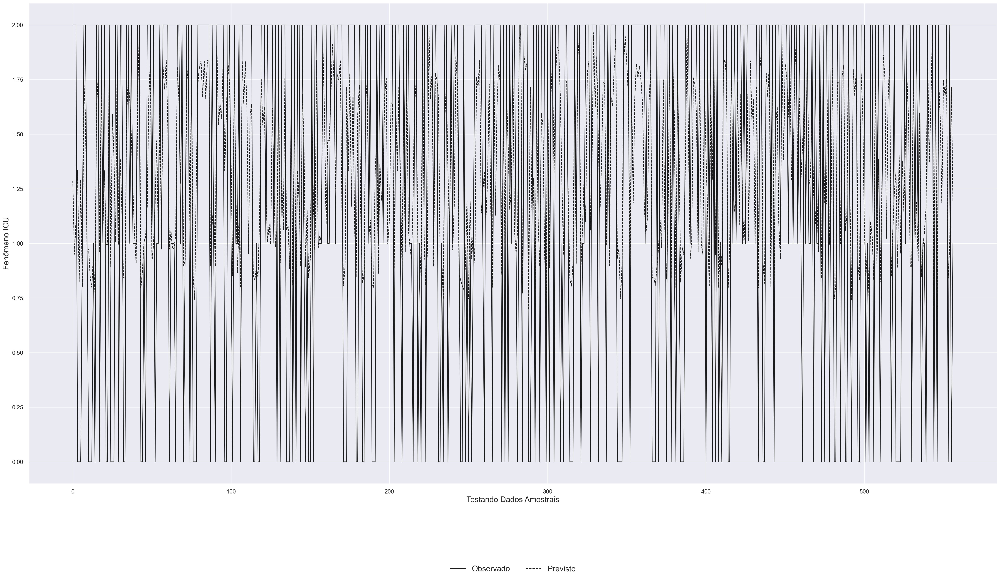

In [135]:
# Plotting the observed and predicted data
import matplotlib.pyplot as plt
# Setting the boundaries and parameters
plt.rcParams['figure.figsize'] = (40,20)
x_ax = range(len(X_test))
# Plotting
plt.plot(x_ax, y_test, label='Observado', color = 'k', linestyle = '-')
plt.plot(x_ax, ytest_pred, label = 'Previsto', color = 'k', linestyle = '--')
plt.ylabel('Fenômeno ICU',fontsize=18)
plt.xlabel('Testando Dados Amostrais',fontsize=18)
plt.legend(bbox_to_anchor = (0.5, -0.2), loc = 'lower center', ncol = 2, frameon = False,fontsize=18)
plt.show()

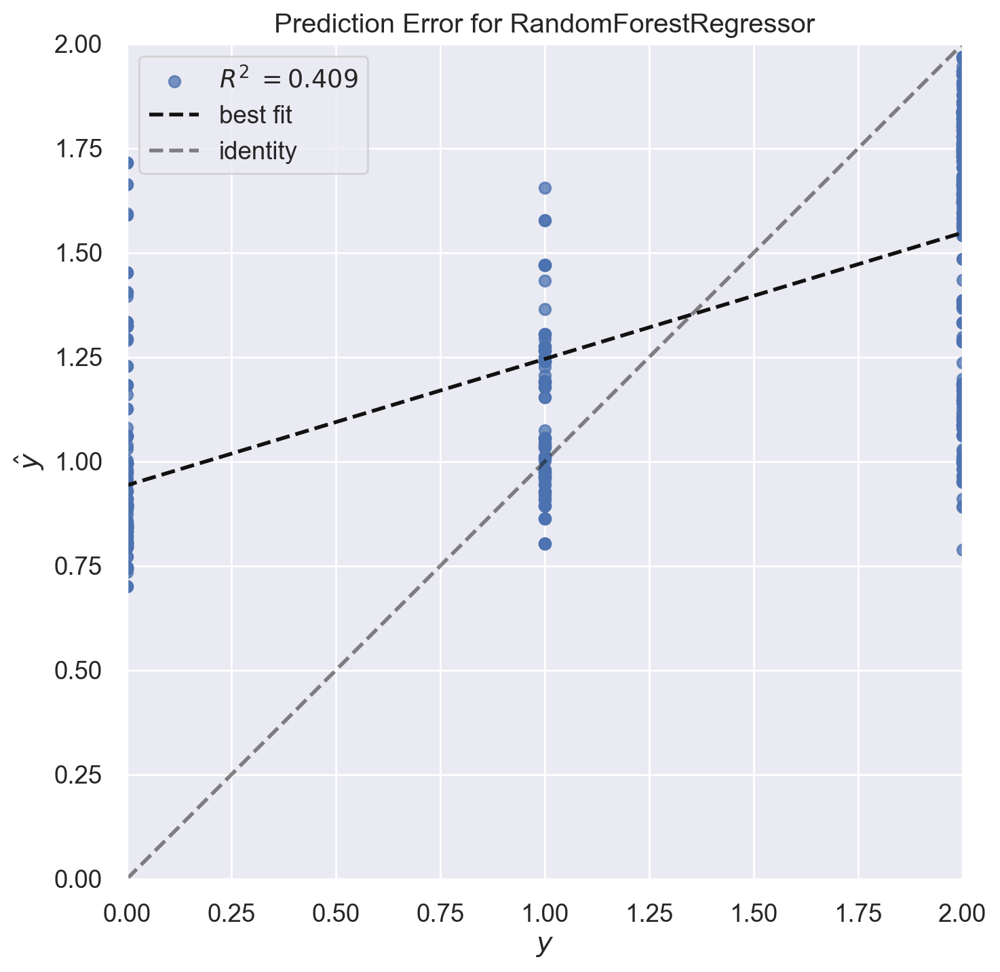

<AxesSubplot: title={'center': 'Prediction Error for RandomForestRegressor'}, xlabel='$y$', ylabel='$\\hat{y}$'>

In [136]:
# Setting the boundaries and parameters
plt.rcParams['figure.figsize'] = (15,8)
#Plotting the prediction errors and residuals
from yellowbrick.regressor import PredictionError
visualizer = PredictionError(reg)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.poof()

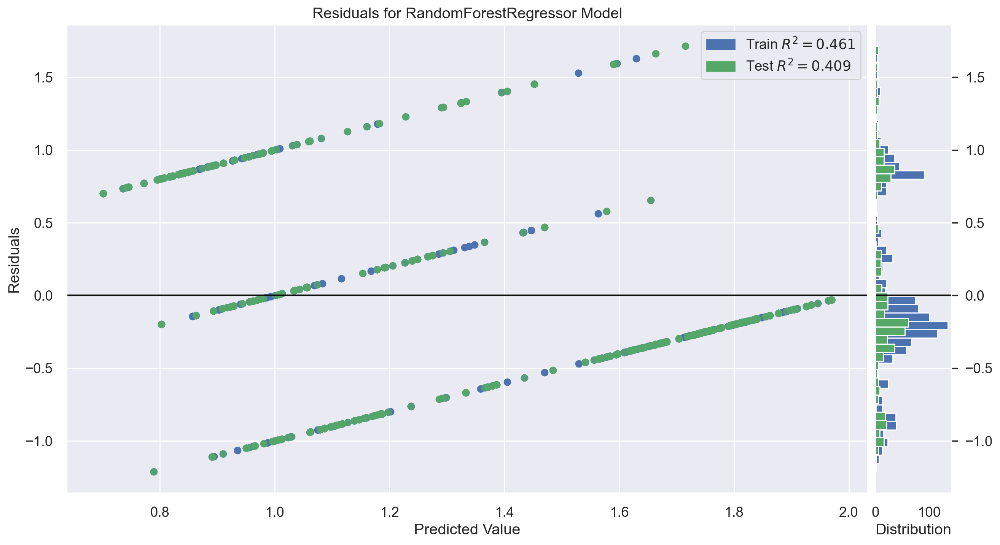

<AxesSubplot: title={'center': 'Residuals for RandomForestRegressor Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [137]:
# Plotting the residuals
plt.rcParams['figure.figsize'] = (15,8)
from yellowbrick.regressor import ResidualsPlot
visualizer = ResidualsPlot(reg)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.poof()

In [138]:
# the k-fold Cross-Validation (CV)
from sklearn.model_selection import cross_val_score
seed = 42
# training model CV
score_train = cross_val_score(reg, X_train, y_train, scoring ='neg_mean_squared_error', cv = 10)
score_train

array([-0.43963838, -0.4339069 , -0.36830569, -0.37797769, -0.45876078,
       -0.35531602, -0.39954538, -0.40096002, -0.40168181, -0.39231377])

In [139]:
# the absolute mean score
print(np.mean(score_train))
# the absolute mean score
from numpy import absolute
print(absolute(np.mean(score_train)))

-0.40284064293551375
0.40284064293551375


In [140]:
# the testing model CV
score_test = cross_val_score(reg, X_test, y_test, scoring ='neg_mean_squared_error', cv = 10)
score_test
print(absolute(np.mean(score_test)))

0.4718788502263317


In [141]:
# Random Forest Features Ranking
from sklearn.pipeline import Pipeline
f_list = list(X.columns)
f_importance = pd.Series(reg.feature_importances_, index = f_list).sort_values(ascending = False)
print(f_importance)

windspeed    0.626111
RH           0.264667
windquad     0.109222
dtype: float64


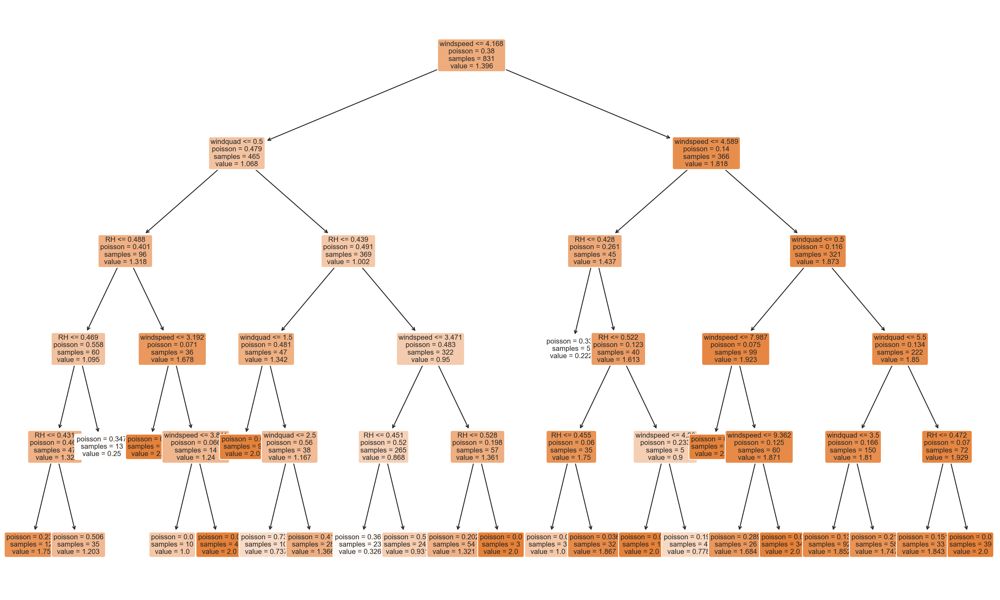

In [142]:
from sklearn import tree
features = X.columns
# Obtain just the first tree
first_tree = reg.estimators_[0]
plt.figure(figsize=(20,12))
tree.plot_tree(first_tree,
               feature_names=features,
               fontsize=8,
               filled=True,
               rounded=True);

In [143]:
print('Mean Absolute Error: %.2f'% mean_absolute_error(y_train, ytrain_pred))
print('Mean Squared Error: %.2f'% mean_squared_error(y_train, ytrain_pred))
print('Root Mean Squared Error: %.2f'% np.sqrt(mean_squared_error(y_train, ytrain_pred)))
print('Explained Variance Score: %.2f'% explained_variance_score(y_train, ytrain_pred))

Mean Absolute Error: 0.48
Mean Squared Error: 0.37
Root Mean Squared Error: 0.61
Explained Variance Score: 0.46


In [144]:
# Model Metrics
#MAE
print('Mean Absolute Error: %.2f'% mean_absolute_error(y_test, ytest_pred))
print('Mean Squared Error: %.2f'% mean_squared_error(y_test, ytest_pred))
print('Root Mean Squared Error: %.2f'% np.sqrt(mean_squared_error(y_test, ytest_pred)))
print('Explained Variance Score: %.2f'% explained_variance_score(y_test, ytest_pred))

Mean Absolute Error: 0.54
Mean Squared Error: 0.44
Root Mean Squared Error: 0.67
Explained Variance Score: 0.41


In [145]:
# from sklearn.metrics import mean_absolute_error, mean_squared_error
print('Mean Absolute Error:', mean_absolute_error(y_test, y_pred))
print('Mean Squared Error:', mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error:', np.sqrt(mean_squared_error(y_test, y_pred)))

Mean Absolute Error: 0.539307874312918
Mean Squared Error: 0.4443644719999516
Root Mean Squared Error: 0.6666066846349139


In [146]:
print(df[feat+[target]].describe().round(2).T)

            count  mean   std   min   25%   50%   75%    max
windspeed  1854.0  5.04  3.70  0.23  2.59  3.69  7.23  23.16
windquad   1854.0  3.04  2.56  0.00  1.00  3.00  6.00   7.00
RH         1854.0  0.48  0.04  0.36  0.45  0.48  0.51   0.54
UHIp2m     1854.0  1.35  0.84  0.00  1.00  2.00  2.00   2.00


In [147]:
# Data treatment
# ==============================================================================
import scipy.stats as stats
# Visual
# ==============================================================================
import plotly.express as px
import pylab
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.figure_factory as ff
# Machine Learnig
# ==============================================================================
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
import statsmodels.stats.api as sms
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
# Metrics
# ==============================================================================
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn import metrics
from sklearn.metrics import confusion_matrix
# Warning Config
# ==============================================================================
import warnings
warnings.filterwarnings('ignore')

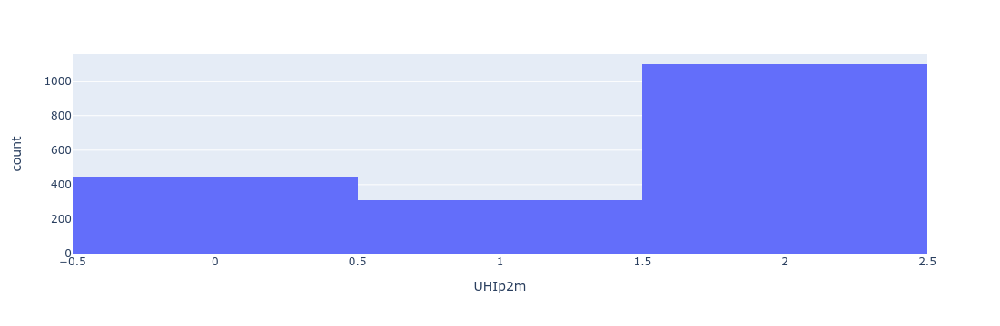

In [148]:
# Setting the boundaries and parameters
plt.rcParams['figure.figsize'] = (15,12)
fig = px.histogram(y, x ="UHIp2m")
fig.show()

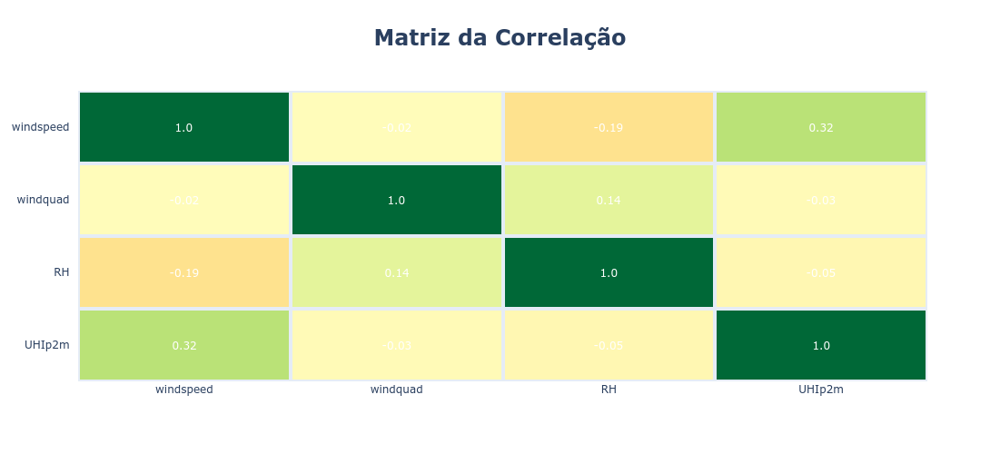

In [149]:
corr = df[feat+[target]].corr()
fig = ff.create_annotated_heatmap(
    z=corr.to_numpy().round(2),
    x=list(corr.index.values),
    y=list(corr.columns.values),
    xgap=4, ygap=4,
    zmin=-1, zmax=1, 
    colorscale='RdYlGn',
    colorbar_thickness=30,
    colorbar_ticklen=3,
)
fig.update_layout(title_text='<b>Matriz da Correlação<b>',
                  title_x=0.5,
                  titlefont={'size': 24},
                  width=700, height=500,
                  xaxis_showgrid=False,
                  xaxis={'side': 'bottom'},
                  yaxis_showgrid=False,
                  yaxis_autorange='reversed',
                  paper_bgcolor=None,
)
fig.show()

In [150]:
Y = df[target]
X = df[feat]
Model = sm.OLS(Y, sm.add_constant(X))
Results = Model.fit()
print(Results.summary())

                            OLS Regression Results                            
Dep. Variable:                 UHIp2m   R-squared:                       0.104
Model:                            OLS   Adj. R-squared:                  0.103
Method:                 Least Squares   F-statistic:                     71.79
Date:                Tue, 17 Oct 2023   Prob (F-statistic):           6.38e-44
Time:                        15:34:17   Log-Likelihood:                -2207.6
No. Observations:                1854   AIC:                             4423.
Df Residuals:                    1850   BIC:                             4445.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.8956      0.251      3.563      0.0

In [151]:
from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(X, y)
r_sq = model.score(X, y)
print(f"coefficient of determination: {r_sq}")

coefficient of determination: 0.10428248520225947


In [152]:
model = LinearRegression().fit(X, y)
r_sq = model.score(X, y)
print(f"coefficient of determination: {r_sq}")
print(f"intercept: {model.intercept_}")
print(f"slope: {model.coef_}")

coefficient of determination: 0.10428248520225947
intercept: 0.895555813183733
slope: [ 0.07356503 -0.0085424   0.23635444]


In [153]:
import statsmodels.api as sm
x, y = np.array(df[feat]), np.array(df[target])
x = sm.add_constant(x)
model = sm.OLS(y, x)
results = model.fit()

print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.104
Model:                            OLS   Adj. R-squared:                  0.103
Method:                 Least Squares   F-statistic:                     71.79
Date:                Tue, 17 Oct 2023   Prob (F-statistic):           6.38e-44
Time:                        15:34:17   Log-Likelihood:                -2207.6
No. Observations:                1854   AIC:                             4423.
Df Residuals:                    1850   BIC:                             4445.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.8956      0.251      3.563      0.0

In [154]:
x = df[feat]
y = df[target]
x = sm.add_constant(x)
model = sm.OLS(y, x).fit()
predictions = model.predict(x)
print_model = model.summary()
print(print_model)

                            OLS Regression Results                            
Dep. Variable:                 UHIp2m   R-squared:                       0.104
Model:                            OLS   Adj. R-squared:                  0.103
Method:                 Least Squares   F-statistic:                     71.79
Date:                Tue, 17 Oct 2023   Prob (F-statistic):           6.38e-44
Time:                        15:34:17   Log-Likelihood:                -2207.6
No. Observations:                1854   AIC:                             4423.
Df Residuals:                    1850   BIC:                             4445.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.8956      0.251      3.563      0.0

In [155]:
X = df[feat+[target]].iloc[:, 1].values.reshape(-1, 1) # values converts it into a numpy array
Y = df[feat+[target]].iloc[:, 2].values.reshape(-1, 1) # -1 means that calculate the dimension of rows, but have 1 column
linear_regressor = LinearRegression() # create object for the class
linear_regressor.fit(X, Y) # perform linear regression
Y_pred = linear_regressor.predict(X) # make predictions

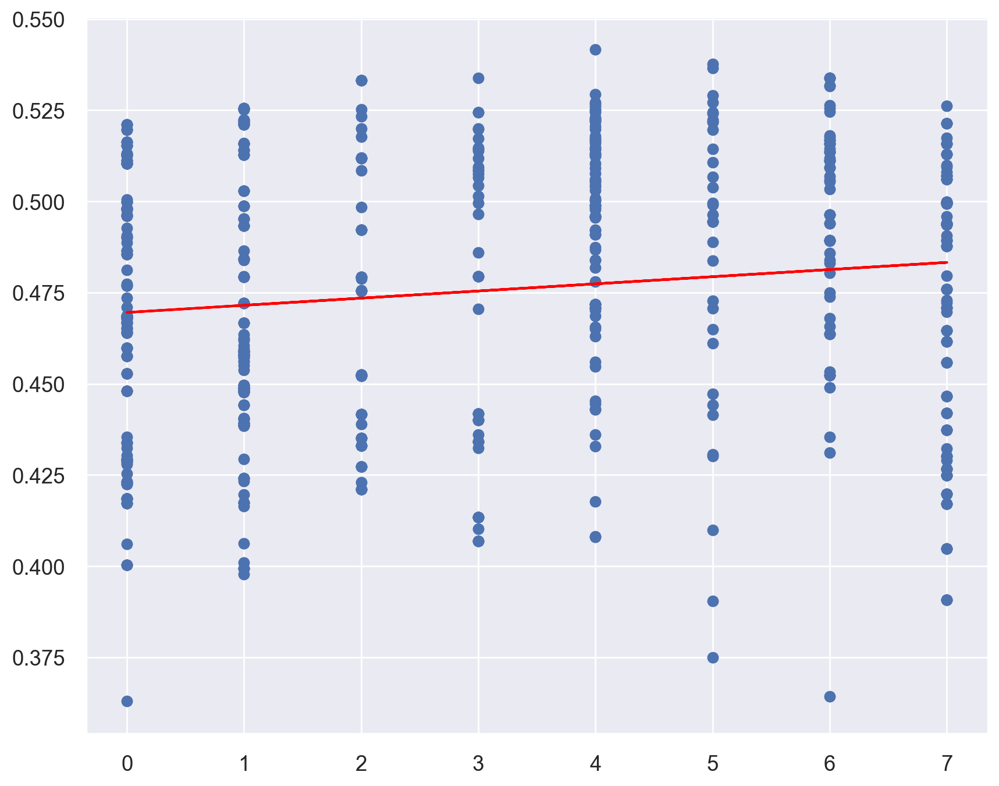

In [156]:
# Setting the boundaries and parameters
plt.rcParams['figure.figsize'] = (10,8)
plt.scatter(X, Y)
plt.plot(X, Y_pred, color='red')
plt.show()

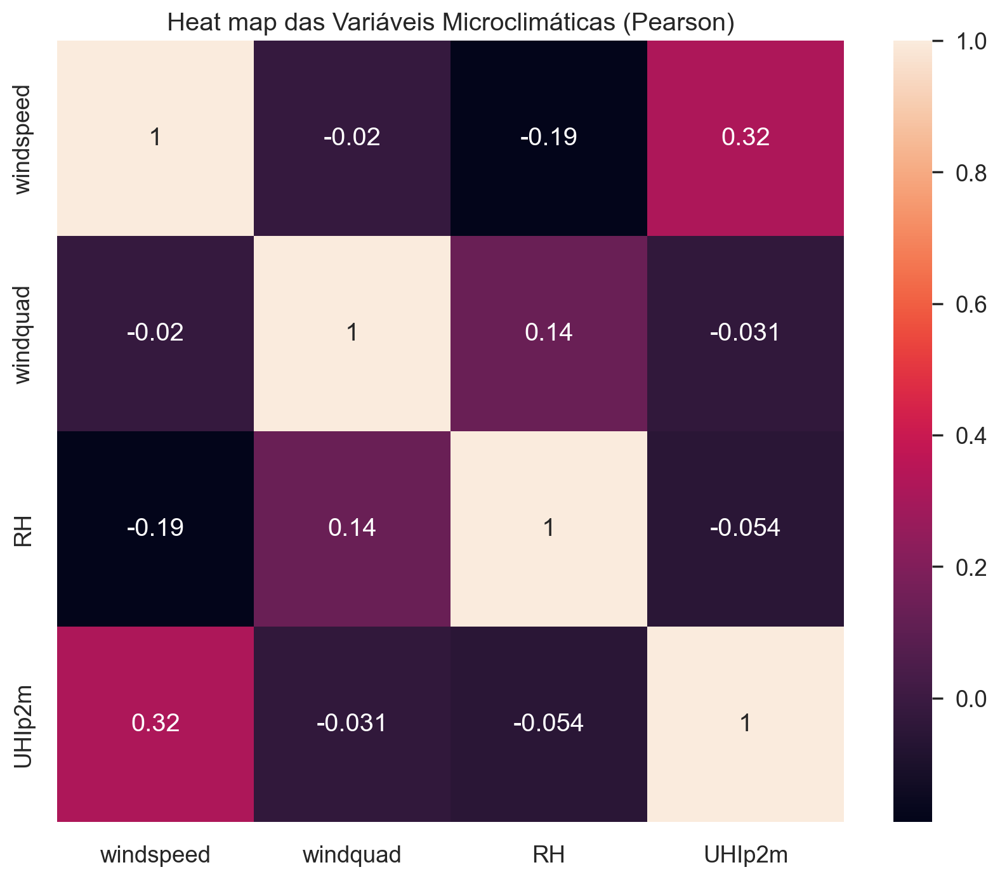

In [157]:
correlations = df[feat + [target]].corr()
# annot=True displays the correlation values
sns.heatmap(correlations, annot=True).set(title='Heat map das Variáveis Microclimáticas (Pearson)');

In [158]:
y = df[target]
X = df[feat]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=random_state)

In [159]:
regressor = LinearRegression()
regressor.fit(X_train, y_train)
print(regressor.intercept_)
print(regressor.coef_)

1.0562296393188269
[ 0.07920988 -0.01633439 -0.05599427]


In [160]:
feature_names = X.columns
model_coefficients = regressor.coef_
coefficients_df = pd.DataFrame(data = model_coefficients, 
                               index = feature_names,
                               columns = ['Coefficient value'])
print(coefficients_df)

           Coefficient value
windspeed           0.079210
windquad           -0.016334
RH                 -0.055994


In [161]:
y_pred = regressor.predict(X_test)
results = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
print(results)

       Actual  Predicted
12868       2   1.220546
24020       2   1.150763
74326       2   0.955532
99366       0   1.254818
22354       0   1.094049
...       ...        ...
99776       2   2.430203
17102       0   1.134106
64499       2   1.143520
12952       0   2.021570
31866       1   1.315112

[557 rows x 2 columns]


In [162]:
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
print(f'Mean absolute error: {mae:.2f}')
print(f'Mean squared error: {mse:.2f}')
print(f'Root mean squared error: {rmse:.2f}')

Mean absolute error: 0.72
Mean squared error: 0.71
Root mean squared error: 0.85


In [163]:
actual_minus_predicted = sum((y_test - y_pred)**2)
actual_minus_actual_mean = sum((y_test - y_test.mean())**2)
r2 = 1 - actual_minus_predicted/actual_minus_actual_mean
print('R²:', r2)
print(regressor.score(X_test, y_test))
print(regressor.score(X_train, y_train))

R²: 0.0493567210983914
0.04935672109838529
0.12310327504670826


In [164]:
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
tree_classifier = DecisionTreeClassifier(max_depth=int(md), random_state=random_state, max_features='auto', criterion='entropy')
tree_classifier.fit(df[features].values, df[target].values)

DecisionTreeClassifier(criterion='entropy', max_depth=5, max_features='auto',
                       random_state=42)

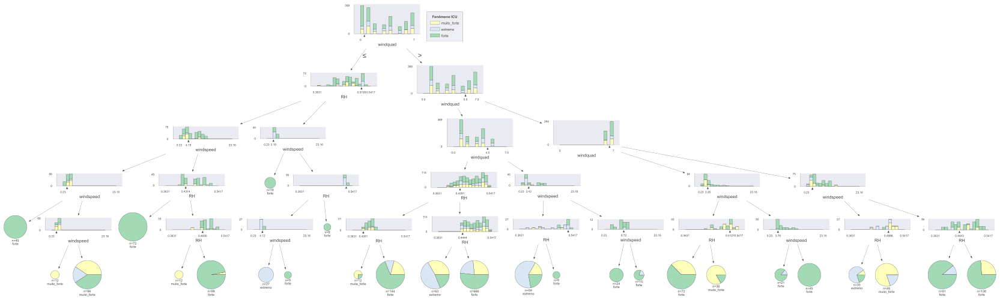

In [165]:
viz_model = dtreeviz.model(tree_classifier, 
                           X_train=df[features],
                           y_train=df[target],
                           feature_names=features,
                           target_name='Fenômeno ICU',
                           class_names=classes)
viz_model.view(scale=0.8)

In [166]:
from sklearn import decomposition, datasets
from sklearn import tree
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
std_slc = StandardScaler()
pca = decomposition.PCA()
dec_tree = tree.DecisionTreeClassifier()
pipe = Pipeline(steps=[('std_slc', std_slc),
('pca', pca),
('dec_tree', dec_tree)])
n_components = list(range(1,X.shape[1]+1,1))
criterion = ['gini', 'entropy']
max_depth = [2,4,6,8,10,12]
parameters = dict(pca__n_components=n_components,
dec_tree__criterion=criterion,
dec_tree__max_depth=max_depth)

In [167]:
clf_GS = GridSearchCV(pipe, parameters)
clf_GS.fit(X, y)
print('Best Criterion:', clf_GS.best_estimator_.get_params()['dec_tree__criterion'])
print('Best max_depth:', clf_GS.best_estimator_.get_params()['dec_tree__max_depth'])
print('Best Number Of Components:', clf_GS.best_estimator_.get_params()['pca__n_components'])
print(); print(clf_GS.best_estimator_.get_params()['dec_tree'])

Best Criterion: gini
Best max_depth: 12
Best Number Of Components: 3

DecisionTreeClassifier(max_depth=12)


In [168]:
from sklearn.model_selection import GridSearchCV
param_grid = {'max_features': ['sqrt', 'log2'],
'ccp_alpha': [0.1, .01, .001],
'max_depth' : [5, 6, 7, 8, 9],
'criterion' :['gini', 'entropy']
}
tree_clas = DecisionTreeClassifier(random_state=42)

In [169]:
grid_search = GridSearchCV(estimator=tree_clas, param_grid=param_grid, cv=5, verbose=True)
grid_search.fit(X_train, y_train)
final_model = grid_search.best_estimator_
final_model

Fitting 5 folds for each of 60 candidates, totalling 300 fits


DecisionTreeClassifier(ccp_alpha=0.001, criterion='entropy', max_depth=9,
                       max_features='sqrt', random_state=42)

In [170]:
#Training the model
tree_clas = DecisionTreeClassifier(ccp_alpha=0.01, class_weight=None, criterion='entropy',
max_depth=9, max_features='sqrt', max_leaf_nodes=None,
min_impurity_decrease=0.0,
min_samples_leaf=1, min_samples_split=2,
min_weight_fraction_leaf=0.0,
random_state=42, splitter='best')
tree_clas.fit(X_train, y_train)
y_predict = tree_clas.predict(X_test)
y_predict

array([1, 0, 2, 1, 0, 2, 0, 2, 2, 1, 0, 0, 0, 0, 0, 2, 2, 0, 2, 1, 2, 0,
       0, 2, 0, 2, 0, 0, 2, 0, 1, 2, 0, 0, 2, 2, 2, 1, 1, 0, 0, 2, 2, 0,
       0, 1, 1, 1, 2, 2, 0, 1, 2, 2, 1, 2, 1, 2, 2, 2, 0, 0, 1, 1, 0, 1,
       2, 2, 2, 2, 0, 1, 2, 2, 2, 2, 0, 0, 1, 2, 2, 2, 2, 2, 2, 2, 2, 0,
       2, 2, 0, 2, 0, 2, 2, 2, 1, 2, 2, 2, 1, 0, 2, 0, 1, 1, 0, 2, 1, 2,
       2, 0, 2, 2, 0, 0, 1, 0, 0, 2, 0, 2, 1, 0, 0, 1, 2, 1, 0, 2, 2, 0,
       1, 1, 2, 2, 1, 0, 1, 0, 2, 0, 2, 2, 0, 0, 2, 0, 1, 0, 0, 2, 2, 2,
       2, 0, 1, 0, 2, 0, 0, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 0, 0, 2, 2, 2,
       1, 2, 2, 1, 2, 2, 2, 0, 0, 2, 2, 1, 2, 0, 0, 0, 1, 1, 0, 1, 0, 2,
       2, 1, 2, 2, 2, 0, 2, 2, 2, 2, 1, 2, 1, 2, 1, 1, 2, 2, 2, 1, 0, 1,
       1, 2, 0, 0, 0, 2, 2, 2, 1, 2, 2, 2, 0, 0, 0, 2, 2, 0, 1, 2, 0, 2,
       2, 2, 1, 0, 0, 0, 0, 1, 0, 2, 0, 0, 2, 2, 2, 2, 0, 1, 0, 1, 1, 2,
       1, 0, 2, 1, 2, 2, 2, 0, 0, 0, 0, 0, 1, 1, 2, 1, 1, 2, 2, 2, 0, 2,
       2, 2, 0, 2, 1, 2, 0, 2, 0, 0, 2, 0, 0, 0, 2,

In [171]:
actual_minus_predicted = sum((y_test - y_pred)**2)
actual_minus_actual_mean = sum((y_test - y_test.mean())**2)
r2 = 1 - actual_minus_predicted/actual_minus_actual_mean
print('R²:', r2)

R²: 0.0493567210983914


In [172]:
import xgboost
import shap

model = xgboost.XGBClassifier(n_estimators=20)
model.fit(X, y)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=20, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)

 97%|=================== | 5374/5562 [00:16<00:00]       

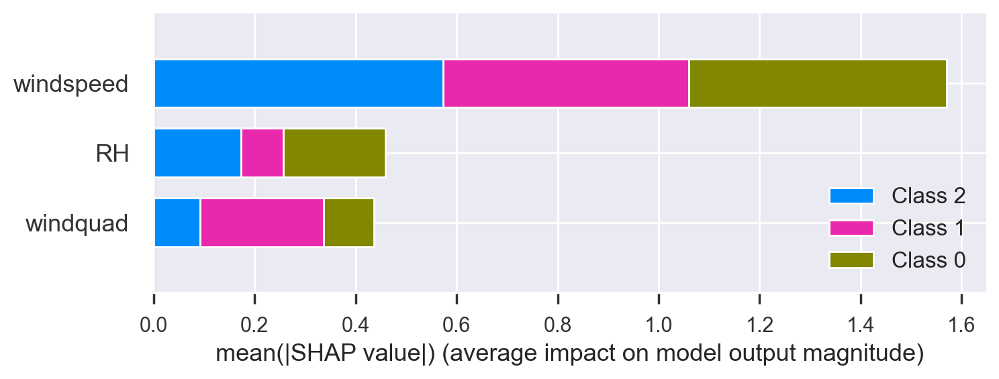

In [173]:
# equilibrated case
background = X.sample(1000) #X is equilibrated# background used in explainer defines base value
explainer = shap.TreeExplainer(model,background,model_output="raw" )
shap_values = explainer.shap_values(X)# background used in the plot, the points that are visible on the plot
shap.summary_plot(shap_values,background, feature_names=background.columns)

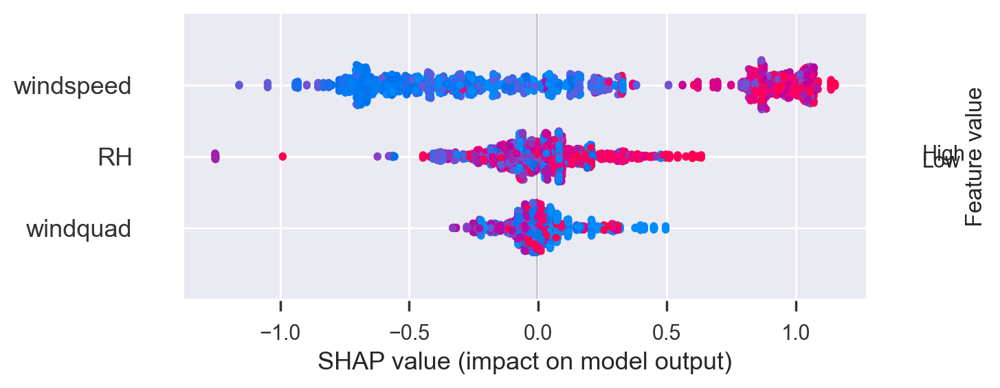

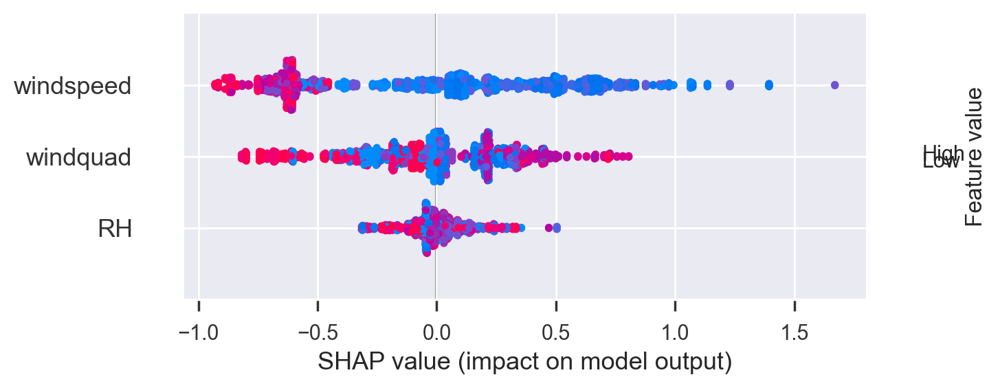

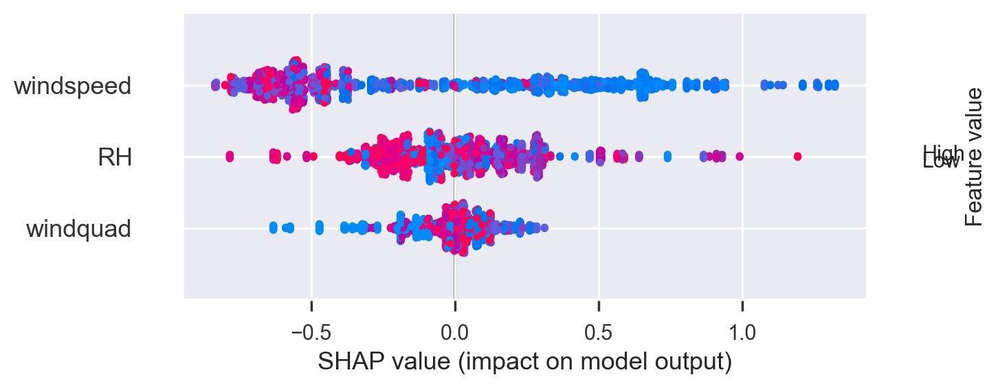

In [174]:
shap.summary_plot(shap_values[2], X)
shap.summary_plot(shap_values[1], X)
shap.summary_plot(shap_values[0], X)

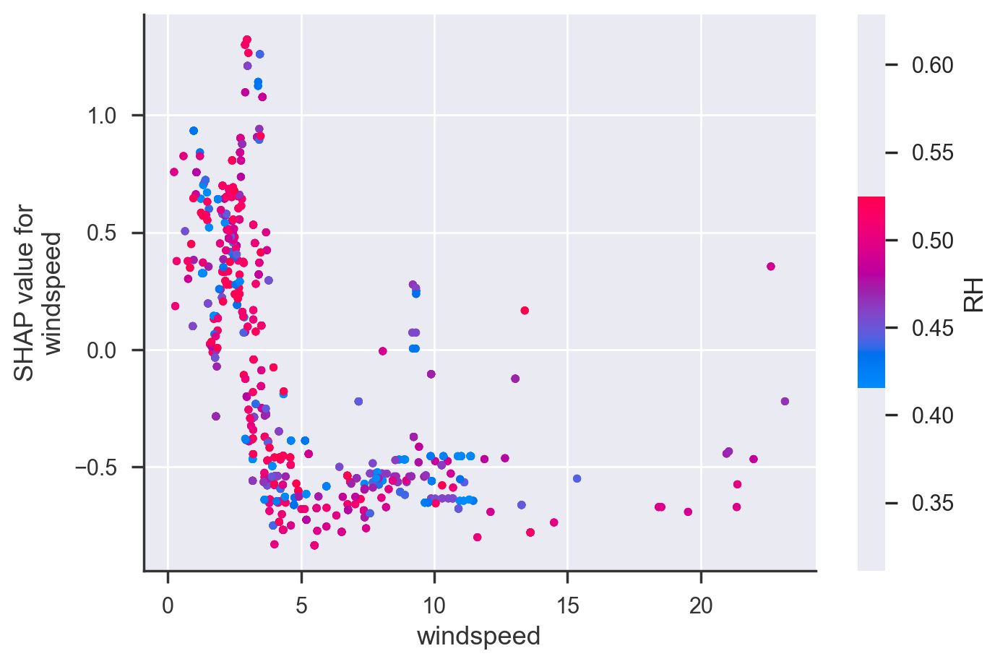

In [175]:
shap.dependence_plot('windspeed', shap_values[0], X, interaction_index="RH")

In [176]:
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[0], X)

In [177]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state=42)
print(X_train.shape)

(1297, 3)


In [178]:
columIndex= 2
shap.force_plot(explainer.expected_value[1], shap_values[1][columIndex,:], X.iloc[columIndex,:], link="logit")

In [179]:
clf = RandomForestClassifier(n_estimators=500, max_depth=8)
clf.fit(X_train, y_train)

RandomForestClassifier(max_depth=8, n_estimators=500)

In [180]:
explainer = shap.TreeExplainer(clf)
shap_values = np.array(explainer.shap_values(X_train))
print(shap_values.shape)

(3, 1297, 3)


In [181]:
shap_values_ = shap_values.transpose((1,0,2))

np.allclose(
    clf.predict_proba(X_train),
    shap_values_.sum(2) + explainer.expected_value
)

True

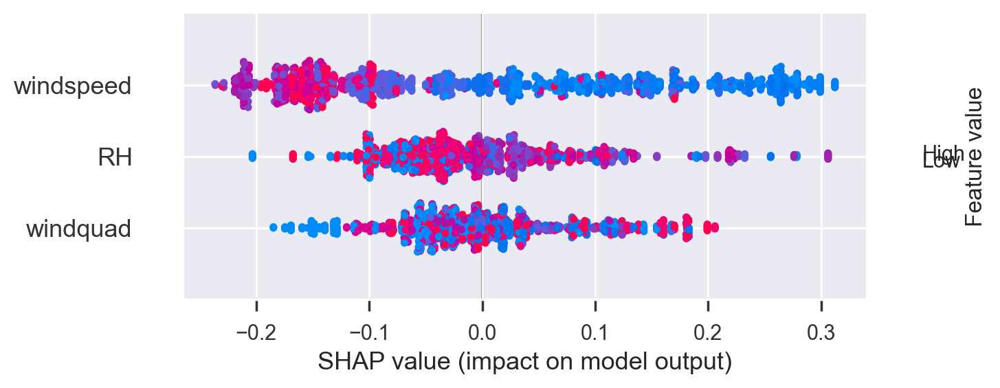

In [182]:
shap.summary_plot(shap_values[0],X_train)

In [183]:
rf = RandomForestClassifier(n_estimators=500, max_depth=8, random_state=42, max_features='sqrt', class_weight='balanced')
rf.fit(X_train, y_train)

# Make predictions for the test set
y_pred_test = rf.predict(X_test)

# Print accuracy for the training and test sets
print("Accuracy on training set: {:.3f}".format(rf.score(X_train, y_train)))
print("Accuracy on test set: {:.3f}".format(rf.score(X_test, y_test)))

Accuracy on training set: 0.917
Accuracy on test set: 0.860


In [184]:
confusion_matrix(y_test, y_pred_test)

array([[129,  18,   5],
       [  1,  91,   0],
       [ 19,  35, 259]])

In [185]:
print(classification_report(y_test, y_pred_test))

              precision    recall  f1-score   support

           0       0.87      0.85      0.86       152
           1       0.63      0.99      0.77        92
           2       0.98      0.83      0.90       313

    accuracy                           0.86       557
   macro avg       0.83      0.89      0.84       557
weighted avg       0.89      0.86      0.87       557



In [186]:
recall_score(y_test, y_pred_test, average=None)[0]

0.8486842105263158

In [187]:
precision_score(y_test, y_pred_test, average=None)[0]

0.8657718120805369

In [188]:
from quantile_forest import RandomForestQuantileRegressor
from sklearn.model_selection import train_test_split

qrf = RandomForestQuantileRegressor(random_state=0)
qrf.fit(X_train, y_train)

# Get the training indices for tree=0, leaf=18683.
y_train_leaves = np.asarray(qrf.forest_.y_train_leaves)
train_indices = y_train_leaves[0, 2, :] - 1
train_indices = train_indices[train_indices >= 0]

# Get the training response values for the training indices
print(np.array(qrf.forest_.y_train)[train_indices])


[]


In [189]:
y_train_leaves.shape

(100, 265, 1)

In [190]:

from sklearn.model_selection import train_test_split # for splitting the data into train and test samples
from sklearn.metrics import classification_report # for model evaluation metrics
from sklearn import tree # for decision tree models

import plotly.express as px  # for data visualization
import plotly.graph_objects as go # for data visualization
import graphviz # for plotting decision tree graphs


In [191]:
def fitting(X, y, criterion, splitter, mdepth, clweight, minleaf):

    # Create training and testing samples
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Fit the model
    model = tree.DecisionTreeClassifier(criterion=criterion, 
                                        splitter=splitter, 
                                        max_depth=mdepth,
                                        class_weight=clweight,
                                        min_samples_leaf=minleaf, 
                                        random_state=42, 
                                  )
    clf = model.fit(X_train, y_train)

    # Predict class labels on training data
    pred_labels_tr = model.predict(X_train)
    # Predict class labels on a test data
    pred_labels_te = model.predict(X_test)

    # Tree summary and model evaluation metrics
    print('*************** Tree Summary ***************')
    print('Classes: ', clf.classes_)
    print('Tree Depth: ', clf.tree_.max_depth)
    print('No. of leaves: ', clf.tree_.n_leaves)
    print('No. of features: ', clf.n_features_in_)
    print('--------------------------------------------------------')
    print("")
    
    print('*************** Evaluation on Test Data ***************')
    score_te = model.score(X_test, y_test)
    print('Accuracy Score: ', score_te)
    # Look at classification report to evaluate the model
    print(classification_report(y_test, pred_labels_te))
    print('--------------------------------------------------------')
    print("")
    
    print('*************** Evaluation on Training Data ***************')
    score_tr = model.score(X_train, y_train)
    print('Accuracy Score: ', score_tr)
    # Look at classification report to evaluate the model
    print(classification_report(y_train, pred_labels_tr))
    print('--------------------------------------------------------')
    
    # Use graphviz to plot the tree
    dot_data = tree.export_graphviz(clf, out_file=None, 
                                feature_names=X.columns, 
                                class_names=[str(list(clf.classes_)[0]), str(list(clf.classes_)[1])],
                                filled=True, 
                                rounded=True, 
                                #rotate=True,
                               ) 
    graph = graphviz.Source(dot_data)
    
    # Return relevant data for chart plotting
    return X_train, X_test, y_train, y_test, clf, graph

In [192]:
# Fit the model and display results
X_train, X_test, y_train, y_test, clf, graph = fitting(X, y, 'entropy', 'best', 
                                                       mdepth=8, 
                                                       clweight=None,
                                                       minleaf=1000)

# Plot the tree graph
graph

# Save tree graph to a PDF
#graph.render('Decision_Tree_all_vars_gini')

*************** Tree Summary ***************
Classes:  [0 1 2]
Tree Depth:  0
No. of leaves:  1
No. of features:  3
--------------------------------------------------------

*************** Evaluation on Test Data ***************
Accuracy Score:  0.5525606469002695
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       106
           1       0.00      0.00      0.00        60
           2       0.55      1.00      0.71       205

    accuracy                           0.55       371
   macro avg       0.18      0.33      0.24       371
weighted avg       0.31      0.55      0.39       371

--------------------------------------------------------

*************** Evaluation on Training Data ***************
Accuracy Score:  0.6021577882670263
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       338
           1       0.00      0.00      0.00       252
           2       0.60      1.00   

IndexError: list index out of range

In [ ]:
# Fit the model and display results
X_train, X_test, y_train, y_test, clf, graph = fitting(X, y, 'entropy', 'best', 
                                                       mdepth=8, 
                                                       clweight=None, 
                                                       minleaf=1000)

# Plot the tree graph
graph

In [ ]:
# import seaborn as sns
# import matplotlib.pyplot as plt
# Creating a seaborn bar plot
sns.barplot(x=model.feature_importances_, y=X.columns)

# Add labels to the graph
plt.xlabel('Pontuação da Importância das Variáveis Micro-Climáticas')
plt.ylabel('Variáveis Micro-Climáticas')

# Add title to the graph
plt.title("")

# Visualize the graph
plt.show()

In [ ]:
# from treeinterpreter import treeinterpreter as ti
# # fit a scikit-learn's regressor model
# # rf = RandomForestRegressor()
# rf.fit(X_train, y_train)
# prediction, bias, contributions = ti.predict(rf, X_test)
# prediction, bias, contributions = ti.predict(rf, X)
# print("Prediction", prediction)
# print("Bias (trainset prior)", bias)
# print("Feature contributions:")
# for c, feature in zip(contributions[0], 
#                              X):
#     print(feature, c)

In [ ]:
g = sns.pairplot(df[['Temp2m','UTFVI2m','RH','windspeed','windquad_cat']], hue='windquad_cat')
g.fig.suptitle("Scatterplot e Histograma dos pares de variáveis codificado pela Direção do Vento", 
               fontsize = 14, # defining the size of the title
               y=1.05); 

In [ ]:
y = df['UHIp2m']
X = df[feat] #.drop(['windquad','windquad_cat','dewPoint','surface_pressure','skinTemp','UTFVI','windpower','UHIp','UHIn','UHIp2m','UHIn2m','UHIt'], axis=1)

In [ ]:
X,y

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [ ]:
model = RandomForestClassifier(n_estimators=500, max_depth=int(md), max_features='log2', random_state=random_state, criterion='gini')

In [ ]:
# Fit RandomForestClassifier
rfc = model.fit(X_train, y_train)
# Predict the test set labels
# y_pred = rfc.predict(X_test)
print('o R² do treino é: %.2f'% rfc.score(X_train, y_train))

In [ ]:
#prediction of the training data
ytrain_pred = rfc.predict(X_train)
print('Mean Absolute Error: %.2f'% mean_absolute_error(y_train, ytrain_pred))
print('Mean Squared Error: %.2f'% mean_squared_error(y_train, ytrain_pred))
print('Root Mean Squared Error: %.2f'% np.sqrt(mean_squared_error(y_train, ytrain_pred)))
print('Explained Variance Score: %.2f'% explained_variance_score(y_train, ytrain_pred))

In [ ]:
#Prediction on the testing data
ytest_pred = rfc.predict(X_test)

#the testing coef of determination
print('O R² do Teste é: %.2f'% r2_score(y_test, ytest_pred)) 
print('O R² do Teste é: %.2f'% rfc.score(X_test, y_test)) 

In [ ]:
print('Mean Absolute Error: %.2f'% mean_absolute_error(y_test, y_pred))
print('Mean Squared Error: %.2f'% mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error: %.2f'% np.sqrt(mean_squared_error(y_test, y_pred)))
print('Explained Variance Score: %.2f'% explained_variance_score(y_test, y_pred))

In [ ]:
print('Mean Absolute Error: %.2f'% mean_absolute_error(y_test, ytest_pred))
print('Mean Squared Error: %.2f'% mean_squared_error(y_test, ytest_pred))
print('Root Mean Squared Error: %.2f'% np.sqrt(mean_squared_error(y_test, ytest_pred)))
print('Explained Variance Score: %.2f'% explained_variance_score(y_test, ytest_pred))

In [ ]:
# Organizing feature names and importances in a DataFrame
features_df = pd.DataFrame({'features': rfc.feature_names_in_, 'importances': rfc.feature_importances_ })
# Sorting data from highest to lowest
features_df_sorted = features_df.sort_values(by='importances', ascending=False)
# Barplot of the result without borders and axis lines
g = sns.barplot(data=features_df_sorted, x='importances', y ='features', palette="rocket")
sns.despine(bottom = True, left = True)
g.set_title('Importância das Variáveis Climáticas')
g.set(xlabel=None)
g.set(ylabel=None)
g.set(xticks=[])
for value in g.containers:
    g.bar_label(value, padding=2)
# plt.savefig("RF-IMAGES/classification/extremo/UTFVI2m/"+folder+"/"+"RF-Importances_Features-log2-"+ano+".png")

In [ ]:
# Plotting the observed and predicted data
import matplotlib.pyplot as plt
# Setting the boundaries and parameters
plt.rcParams['figure.figsize'] = (40,15)
x_ax = range(len(X_test))
# Plotting 
plt.plot(x_ax, y_test, label='Observado', color = 'k', linestyle = '-')
plt.plot(x_ax, ytest_pred, label = 'Previsto', color = 'k', linestyle = '--')
plt.ylabel('Direção do Vento', fontsize=15)
plt.xlabel('Testando Dados Amostrais',fontsize=15)
plt.legend(bbox_to_anchor = (0.5, -0.2), loc = 'lower center', ncol = 2, frameon =  False,fontsize=15)
# plt.show()
plt.savefig("RF-IMAGES/classification/extremo/UTFVI2m/all/"+folder+"/"+"RF-WINDQUADxall-MD"+md+"-"+ano+".png")

In [ ]:
#Plotting the classification errors and residuals 
# Setting the boundaries and parameters
plt.rcParams['figure.figsize'] = (7,4)

from yellowbrick.classifier import ClassificationReport
visualizer = ClassificationReport(rfc,classes=classes, support=True)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.poof()

In [ ]:
from yellowbrick.classifier import ConfusionMatrix
cm = ConfusionMatrix(
    rfc, classes=classes,
    percent=True
    #label_encoder={0: 'Adelie', 1: 'Chinstrap', 2: 'Gentoo'}
)
cm.fit(X_train, y_train)
cm.score(X_test, y_test)
cm.show();

In [ ]:
from yellowbrick.classifier import ClassPredictionError
visualizer = ClassPredictionError(
    rfc, classes=classes)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.show();

In [ ]:
from yellowbrick.model_selection import FeatureImportances
from sklearn.ensemble import RandomForestClassifier
visualizer = FeatureImportances(rfc)
visualizer.fit(X_train, y_train)
visualizer.show();

In [ ]:
from yellowbrick.classifier import ROCAUC
# from sklearn.linear_model import LogisticRegression
# X, y = load_spam()
# X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y)
# model = LogisticRegression(max_iter=10000)
# model.fit(X_train, y_train)
visualizer = ROCAUC(rfc, classes = classes) #['Segundo', 'Oitavo', 'Primeiro', 'Sétimo', 'Terceiro', 'Quarto', 'Quinto', 'Sexto'])
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.show();

In [ ]:
from sklearn.svm import LinearSVC
from yellowbrick.classifier import ROCAUC

model = LinearSVC()
visualizer = ROCAUC(model)
visualizer.fit(X,y)
visualizer.score(X,y)
visualizer.show()

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d').set_title('Matriz de Confusão - Dir. do Vento (Quadrantes)')

print(classification_report(y_test,y_pred))

In [ ]:
# Organizing feature names and importances in a DataFrame
features_df = pd.DataFrame({'features': rfc.feature_names_in_, 'importances': rfc.feature_importances_ })

# Sorting data from highest to lowest
features_df_sorted = features_df.sort_values(by='importances', ascending=False)

# Barplot of the result without borders and axis lines
g = sns.barplot(data=features_df_sorted, x='importances', y ='features', palette="rocket")
sns.despine(bottom = True, left = True)
g.set_title('Importância das Variáveis Climáticas')
g.set(xlabel=None)
g.set(ylabel=None)
g.set(xticks=[])
for value in g.containers:
    g.bar_label(value, padding=2)

In [ ]:
rfc_ = RandomForestClassifier(n_estimators=900, 
                             max_depth=int(md),
                             random_state=random_state,
                             criterion='gini')
rfc_.fit(X_train, y_train)
y_pred = rfc_.predict(X_test)

In [ ]:
regc = rfc_.fit(X_train, y_train)
print('o R² do treino é: %.2f'% regc.score(X_train, y_train))

In [ ]:
cm_ = confusion_matrix(y_test, y_pred)
sns.heatmap(cm_, annot=True, fmt='d').set_title('Matriz de Confusão - Dir. do Vento (Quadrantes) para 900 árvores com 8 níveis')

print(classification_report(y_test,y_pred))

In [ ]:
# Organizing feature names and importances in a DataFrame
features_df = pd.DataFrame({'features': rfc_.feature_names_in_, 'importances': rfc_.feature_importances_ })

# Sorting data from highest to lowest
features_df_sorted = features_df.sort_values(by='importances', ascending=False)

# Barplot of the result without borders and axis lines
g = sns.barplot(data=features_df_sorted, x='importances', y ='features', palette="rocket")
sns.despine(bottom = True, left = True)
g.set_title('Importância das Variáveis Climáticas')
g.set(xlabel=None)
g.set(ylabel=None)
g.set(xticks=[])
for value in g.containers:
    g.bar_label(value, padding=2)

In [ ]:
y = df['UHIn2m']
X = df.drop(['UTFVI2m','dewPoint','surface_pressure','windquad_cat','skinTemp','UTFVI','windpower','UHIp','UHIn','UHIp2m','UHIn2m','UHIt'], axis=1)

In [ ]:
X

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=random_state)

In [ ]:
from sklearn.ensemble import RandomForestRegressor

model = RandomForestRegressor(n_estimators=500, # 20 trees
                            max_depth=int(md), # 4 levels
                            random_state=random_state,
                            max_features='log2',
                            criterion='poisson')

# rfr.fit(X_train, y_train)
# y_pred = rfr.predict(X_test)

In [ ]:
reg = model.fit(X_train, y_train)
print('o R² do treino é: %.2f'% reg.score(X_train, y_train))

In [ ]:
ytrain_pred = reg.predict(X_train)
y_pred = reg.predict(X_test)

In [ ]:
print('Mean Absolute Error: %.2f'% mean_absolute_error(y_train, ytrain_pred))
print('Mean Squared Error: %.2f'% mean_squared_error(y_train, ytrain_pred))
print('Root Mean Squared Error: %.2f'% np.sqrt(mean_squared_error(y_train, ytrain_pred)))
print('Explained Variance Score: %.2f'% explained_variance_score(y_train, ytrain_pred))

In [ ]:
#Prediction on the testing data
ytest_pred = reg.predict(X_test)

In [ ]:
#the testing coef of determination
print('O R² do Teste é: %.2f'% r2_score(y_test, ytest_pred)) 

In [ ]:
print('O R² do Teste é: %.2f'% reg.score(X_test, y_test)) 

In [ ]:
# Model Metrics
#MAE
print('Mean Absolute Error: %.2f'% mean_absolute_error(y_test, ytest_pred))
print('Mean Squared Error: %.2f'% mean_squared_error(y_test, ytest_pred))
print('Root Mean Squared Error: %.2f'% np.sqrt(mean_squared_error(y_test, ytest_pred)))
print('Explained Variance Score: %.2f'% explained_variance_score(y_test, ytest_pred))

In [ ]:
# Plotting the observed and predicted data
import matplotlib.pyplot as plt
# Setting the boundaries and parameters
plt.rcParams['figure.figsize'] = (40,20)
x_ax = range(len(X_test))
# Plotting 
plt.plot(x_ax, y_test, label='Observado', color = 'k', linestyle = '-')
plt.plot(x_ax, ytest_pred, label = 'Previsto', color = 'k', linestyle = '--')
plt.ylabel('Direção do Vento',fontsize=18)
plt.xlabel('Testando Dados Amostrais',fontsize=18)
plt.legend(bbox_to_anchor = (0.5, -0.2), loc = 'lower center', ncol = 2, frameon =  False,fontsize=18)
plt.show()

In [ ]:
# Setting the boundaries and parameters
plt.rcParams['figure.figsize'] = (15,8)
#Plotting the prediction errors and residuals 
from yellowbrick.regressor import PredictionError
visualizer = PredictionError(reg)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.poof()

In [ ]:
# Plotting the residuals
from yellowbrick.regressor import ResidualsPlot
visualizer = ResidualsPlot(reg)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.poof()

In [ ]:
# the k-fold Cross-Validation (CV)
from sklearn.model_selection import cross_val_score
seed = 42
# training model CV
score_train = cross_val_score(reg, X_train, y_train, scoring = 'neg_mean_squared_error', cv = 10)
score_train

In [ ]:
# the absolute mean score
print(np.mean(score_train))

In [ ]:
# the absolute mean score
from numpy import absolute
print(absolute(np.mean(score_train)))

In [ ]:
# the testing model CV
score_test = cross_val_score(reg, X_test, y_test, scoring = 'neg_mean_squared_error', cv = 10)
score_test

In [ ]:
print(absolute(np.mean(score_test)))

In [ ]:
# Random Forest Features Ranking
from sklearn.pipeline import Pipeline

In [ ]:
f_list = list(X.columns)
f_importance = pd.Series(reg.feature_importances_, index = f_list).sort_values(ascending  = False) 

f_importance

In [ ]:
# Barplot of the result without borders and axis lines
g = sns.barplot(data=f_importance, x=X.columns, y =reg.feature_importances_, palette="rocket")
sns.despine(bottom = True, left = True)
g.set_title('Importância das Variáveis Climáticas')
g.set(xlabel=None)
g.set(ylabel=None)
g.set(xticks=[])
for value in g.containers:
    g.bar_label(value, padding=2)

In [ ]:
from sklearn import tree

features = X.columns
# Obtain just the first tree
first_tree = reg.estimators_[0]

# plt.figure(figsize=(15,6))
# tree.plot_tree(first_tree,
#                feature_names=features,
#                fontsize=8, 
#                filled=True, 
#                rounded=True);


In [ ]:
viz_model = dtreeviz.model(first_tree, tree_index=t_index,
                             X_train=X_train,
                             y_train=y_train,
                             feature_names=features,
                             target_name='Dir. do Vento',
                             class_names=classes)
viz_model.view(scale=1)

In [ ]:
print('Mean Absolute Error: %.2f'% mean_absolute_error(y_train, ytrain_pred))
print('Mean Squared Error: %.2f'% mean_squared_error(y_train, ytrain_pred))
print('Root Mean Squared Error: %.2f'% np.sqrt(mean_squared_error(y_train, ytrain_pred)))
print('Explained Variance Score: %.2f'% explained_variance_score(y_train, ytrain_pred))

In [ ]:
# Model Metrics
#MAE
print('Mean Absolute Error: %.2f'% mean_absolute_error(y_test, ytest_pred))
print('Mean Squared Error: %.2f'% mean_squared_error(y_test, ytest_pred))
print('Root Mean Squared Error: %.2f'% np.sqrt(mean_squared_error(y_test, ytest_pred)))
print('Explained Variance Score: %.2f'% explained_variance_score(y_test, ytest_pred))

In [ ]:
# from sklearn.metrics import mean_absolute_error, mean_squared_error

print('Mean Absolute Error:', mean_absolute_error(y_test, y_pred))
print('Mean Squared Error:', mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error:', np.sqrt(mean_squared_error(y_test, y_pred)))

In [ ]:
# Data treatment
# ==============================================================================
import scipy.stats as stats

# Visual
# ==============================================================================
import plotly.express as px
import pylab
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.figure_factory as ff

# Machine Learnig 
# ==============================================================================

from sklearn.model_selection import train_test_split
import statsmodels.api as sm
import statsmodels.stats.api as sms
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

# Metrics
# ==============================================================================
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error 
from sklearn import metrics
from sklearn.metrics import confusion_matrix

# Warning Config
# ==============================================================================
import warnings
warnings.filterwarnings('ignore')

In [ ]:
# Setting the boundaries and parameters
plt.rcParams['figure.figsize'] = (20,15)
fig = px.histogram(y, x ="UHIn2m")
fig.show()

In [ ]:
corr = df[feat+[target]].corr()

fig = ff.create_annotated_heatmap(
    z=corr.to_numpy().round(2),
    x=list(corr.index.values),
    y=list(corr.columns.values),       
    xgap=4, ygap=4,
    zmin=-1, zmax=1,
    colorscale='RdYlGn',
    colorbar_thickness=30,
    colorbar_ticklen=3,
)
fig.update_layout(title_text='<b>Correlation Matrix (cont. features)<b>',
                  title_x=0.5,
                  titlefont={'size': 24},
                  width=500, height=500,
                  xaxis_showgrid=False,
                  xaxis={'side': 'bottom'},
                  yaxis_showgrid=False,
                  yaxis_autorange='reversed',                   
                  paper_bgcolor=None,
                  )
fig.show()

In [ ]:
Y = df[target]
X = df[feat]
Model = sm.OLS(Y, sm.add_constant(X))
Results = Model.fit()
print(Results.summary())

In [ ]:
from sklearn.linear_model import LinearRegression
model = LinearRegression()

In [ ]:
model.fit(X, y)
r_sq = model.score(X, y)
print(f"coefficient of determination: {r_sq}")

In [ ]:
model = LinearRegression().fit(X, y)
r_sq = model.score(X, y)
print(f"coefficient of determination: {r_sq}")

In [ ]:
print(f"intercept: {model.intercept_}")
intercept: 5.633333333333329
print(f"slope: {model.coef_}")

In [ ]:
import statsmodels.api as sm

In [ ]:
x, y = np.array(df[feat]), np.array(df[target])

In [ ]:
x = sm.add_constant(x)

In [ ]:
model = sm.OLS(y, x)

In [ ]:
results = model.fit()

In [ ]:
print(results.summary())

In [ ]:
x = df[feat]
y = df[target]
x = sm.add_constant(x)

model = sm.OLS(y, x).fit()
predictions = model.predict(x) 

print_model = model.summary()
print(print_model)

In [ ]:
df[feat+[target]]

In [ ]:
X = df[feat+[target]].iloc[:, 1].values.reshape(-1, 1)  # values converts it into a numpy array
Y = df[feat+[target]].iloc[:, 2].values.reshape(-1, 1)  # -1 means that calculate the dimension of rows, but have 1 column
linear_regressor = LinearRegression()  # create object for the class
linear_regressor.fit(X, Y)  # perform linear regression
Y_pred = linear_regressor.predict(X)  # make predictions

In [ ]:
# Setting the boundaries and parameters
plt.rcParams['figure.figsize'] = (10,8)

plt.scatter(X, Y)
plt.plot(X, Y_pred, color='red')
plt.show()

In [ ]:
y = df['windquad'].values.reshape(-1, 1)
X = df['UHIn2m'].values.reshape(-1, 1)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42)

In [ ]:
from sklearn.linear_model import LinearRegression
regressor = LinearRegression()
regressor.fit(X_train, y_train)

In [ ]:
print(regressor.intercept_)
print(regressor.coef_)

In [ ]:
def calc(slope, intercept, UTFVI2m):
    return slope*UTFVI2m+intercept

score = calc(regressor.coef_, regressor.intercept_, .0022)
print(score) 

In [ ]:
# Passing 9.5 in double brackets to have a 2 dimensional array
score = regressor.predict([[0.0022]])
print(score) 

In [ ]:
y_pred = regressor.predict(X_test)

In [ ]:
df_preds = pd.DataFrame({'Actual': y_test.squeeze(), 'Predicted': y_pred.squeeze()})
print(df_preds)

In [ ]:
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f'Mean absolute error: {mae:.2f}')
print(f'Mean squared error: {mse:.2f}')
print(f'Root mean squared error: {rmse:.2f}')

In [ ]:
print(df[feat+[target]].describe().round(2).T)

In [ ]:
import seaborn as sns # Convention alias for Seaborn

variables = feat

for var in variables:
    plt.figure() # Creating a rectangle (figure) for each plot
    # Regression Plot also by default includes
    # best-fitting regression line
    # which can be turned off via `fit_reg=False`
    sns.regplot(x=var, y=target, data=df).set(title=f'Regressão de {var} e Fenômeno ICU');

In [ ]:
correlations = df[feat + [target]].corr()
# annot=True displays the correlation values
sns.heatmap(correlations, annot=True).set(title='Heat map das Variáveis Microclimáticas (Pearson)');

In [ ]:
y = df[target]
X = df[feat]

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,  random_state=random_state)

In [ ]:
regressor = LinearRegression()
regressor.fit(X_train, y_train)

In [ ]:
print(regressor.intercept_)
print(regressor.coef_)

In [ ]:
feature_names = X.columns
model_coefficients = regressor.coef_

coefficients_df = pd.DataFrame(data = model_coefficients, 
                              index = feature_names, 
                              columns = ['Coefficient value'])
print(coefficients_df)

In [ ]:
y_pred = regressor.predict(X_test)

In [ ]:
results = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
print(results)

In [ ]:
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f'Mean absolute error: {mae:.2f}')
print(f'Mean squared error: {mse:.2f}')
print(f'Root mean squared error: {rmse:.2f}')

In [ ]:
actual_minus_predicted = sum((y_test - y_pred)**2)
actual_minus_actual_mean = sum((y_test - y_test.mean())**2)
r2 = 1 - actual_minus_predicted/actual_minus_actual_mean
print('R²:', r2)

In [ ]:
print(regressor.score(X_test, y_test))
print(regressor.score(X_train, y_train))

In [ ]:
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
tree_classifier = DecisionTreeClassifier(max_depth=int(md), random_state=random_state, max_features='auto', criterion='entropy')
tree_classifier.fit(df[features].values, df[target].values)

In [ ]:
viz_model = dtreeviz.model(tree_classifier,
                           X_train=df[features], 
                           y_train=df[target],
                           feature_names=features,
                           target_name='Fenômeno ICU', 
                           class_names=classes)

In [ ]:
viz_model.view(scale=0.8)

In [ ]:
from sklearn import decomposition, datasets
from sklearn import tree
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler

std_slc = StandardScaler()
pca = decomposition.PCA()
dec_tree = tree.DecisionTreeClassifier()
pipe = Pipeline(steps=[('std_slc', std_slc),
                           ('pca', pca),
                           ('dec_tree', dec_tree)])
n_components = list(range(1,X.shape[1]+1,1))
criterion = ['gini', 'entropy']
max_depth = [2,4,6,8,10,12]
parameters = dict(pca__n_components=n_components,
                      dec_tree__criterion=criterion,
                      dec_tree__max_depth=max_depth)

In [ ]:
clf_GS = GridSearchCV(pipe, parameters)
clf_GS.fit(X, y)
print('Best Criterion:', clf_GS.best_estimator_.get_params()['dec_tree__criterion'])
print('Best max_depth:', clf_GS.best_estimator_.get_params()['dec_tree__max_depth'])
print('Best Number Of Components:', clf_GS.best_estimator_.get_params()['pca__n_components'])
print(); print(clf_GS.best_estimator_.get_params()['dec_tree'])

In [ ]:
from sklearn.model_selection import GridSearchCV

param_grid = {'max_features': ['sqrt', 'log2'],
              'ccp_alpha': [0.1, .01, .001],
              'max_depth' : [5, 6, 7, 8, 9],
              'criterion' :['gini', 'entropy']
             }
tree_clas = DecisionTreeClassifier(random_state=42)
grid_search = GridSearchCV(estimator=tree_clas, param_grid=param_grid, cv=5, verbose=True)
grid_search.fit(X_train, y_train)

In [ ]:
final_model = grid_search.best_estimator_
final_model

In [ ]:
#Training the model
tree_clas = DecisionTreeClassifier(ccp_alpha=0.01, class_weight=None, criterion='entropy',
                       max_depth=9, max_features='sqrt', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, 
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, 
                       random_state=42, splitter='best')
tree_clas.fit(X_train, y_train)
y_predict = tree_clas.predict(X_test)

In [ ]:
actual_minus_predicted = sum((y_test - y_pred)**2)
actual_minus_actual_mean = sum((y_test - y_test.mean())**2)
r2 = 1 - actual_minus_predicted/actual_minus_actual_mean
print('R²:', r2)

In [ ]:
# from sklearn.model_selection import RandomizedSearchCV# number of trees in random forest
# n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]# number of features at every split
# max_features = ['log2', 'sqrt']

# # max depth
# max_depth = [int(x) for x in np.linspace(100, 500, num = 11)]
# max_depth.append(None)# create random grid
# random_grid = {
#  'n_estimators': n_estimators,
#  'max_features': max_features,
#  'max_depth': max_depth
#  }# Random search of parameters
# rfc_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 10, random_state=42, n_jobs = -1)# Fit the model
# rfc_random.fit(X_train, y_train)# print results
# print(rfc_random.best_params_)

In [ ]:
# rfc = RandomForestClassifier(n_estimators=600, max_depth=300, max_features='sqrt')
# rfc.fit(X_train,y_train)
# rfc_predict = rfc.predict(X_test)
# rfc_cv_score = cross_val_score(rfc, X, y, cv=10, scoring='roc_auc')

# print("=== Confusion Matrix ===")
# print(confusion_matrix(y_test, rfc_predict))
# print('\n')print("=== Classification Report ===")
# print(classification_report(y_test, rfc_predict))
# print('\n')print("=== All AUC Scores ===")print(rfc_cv_score)
# print('\n')print("=== Mean AUC Score ===")
# print("Mean AUC Score - Random Forest: ", rfc_cv_score.mean())

In [ ]:
import xgboost
import shap

model = xgboost.XGBClassifier(n_estimators=20)
model.fit(X, y)

In [ ]:
X

In [ ]:
y

In [ ]:
# equilibrated case
background = X.sample(1000) #X is equilibrated# background used in explainer defines base value
explainer = shap.TreeExplainer(model,background,model_output="raw" )
shap_values = explainer.shap_values(X)# background used in the plot, the points that are visible on the plot
shap.summary_plot(shap_values,background, feature_names=background.columns)

In [ ]:
X

In [ ]:
windquad = (
    X['windquad']
    .apply(lambda quad: 'primeiro' if quad == 0 else ('segundo' if quad == 1 else ('terceiro' if quad == 2 else ('quarto' if quad == 3 else 
                                                                                                                ('quinto' if quad == 4 else 
                                                                                                                ('sexto' if quad == 5 else 
                                                                                                                ('sétimo' if quad == 6 else 'oitavo')))))))                                                                                                
    .values
)

In [ ]:
X,y

In [ ]:
# X['quad'] = X['windquad'].apply(lambda quad: 'primeiro' if quad == 0 else ('segundo' if quad == 1 else ('terceiro' if quad == 2 else ('quarto' if quad == 3 else 
#                                                                                                                 ('quinto' if quad == 4 else 
#                                                                                                                 ('sexto' if quad == 5 else 
#                                                                                                                 ('sétimo' if quad == 6 else 'oitavo')))))))

In [ ]:
rfc = RandomForestClassifier(max_depth=int(md), random_state=random_state, n_estimators=500)
rfc.fit(X, y)
importances = rfc.feature_importances_
indices = np.argsort(importances)
features = X.columns
plt.figure(figsize=(10,5))
plt.title('Variáveis mais Importantes')
plt.barh(range(len(indices)), importances[indices], color='g', align='center',linestyle="solid",alpha=0.8)
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Importância')
plt.show()

In [ ]:
explainer = shap.KernelExplainer(rfc.predict_proba,X[:100])
shap_values = explainer.shap_values(X[:100])
shap.summary_plot(shap_values, X[:100])

In [ ]:
#class 0 -> muito_forte
#class 1 -> Forte
#class 2 -> Extremo

In [ ]:
explainer = shap.TreeExplainer(rfc)
shap_values = explainer.shap_values(X)
shap.summary_plot(shap_values, X)

In [ ]:
shap.summary_plot(shap_values[2], X)
shap.summary_plot(shap_values[1], X)
shap.summary_plot(shap_values[0], X)

In [ ]:
shap.dependence_plot("Temp2m", shap_values[1], X)

In [ ]:
shap.dependence_plot("Temp2m", shap_values[2], X)

In [ ]:
shap.dependence_plot('Temp2m', shap_values[1], X, interaction_index="RH")

In [ ]:
shap.dependence_plot('windquad', shap_values[2], X, interaction_index="RH")

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[0], X)

In [ ]:
shap.initjs()
columIndex= 2
shap.force_plot(explainer.expected_value[1], shap_values[1][columIndex,:], X.iloc[columIndex,:], link="logit")

In [ ]:
shap.decision_plot(explainer.expected_value[1], shap_values[1], X,link="logit",highlight=1)

In [ ]:
import shap
rf_shap_values = shap.KernelExplainer(rf.predict,X_test)

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.ensemble import RandomForestRegressor

In [ ]:
# Split the data into train and test data:
X_train, X_test, Y_train, Y_test = train_test_split(X, y, test_size = 0.2)

In [ ]:
rf = RandomForestRegressor(max_depth=6, random_state=0, n_estimators=10)
rf.fit(X_train, Y_train)  
print(rf.feature_importances_)
importances = rf.feature_importances_
indices = np.argsort(importances)
features = X_train.columns
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

In [ ]:
explainer = shap.KernelExplainer(rfc.predict_proba,X[:100])
shap_values = explainer.shap_values(X[:100])
shap.summary_plot(shap_values, X[:100])

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)
print(X_train.shape)

In [ ]:
clf = RandomForestClassifier(n_estimators=500, max_depth=8)
clf.fit(X_train, y_train)

In [ ]:
explainer = shap.TreeExplainer(clf)
shap_values = np.array(explainer.shap_values(X_train))
print(shap_values.shape)

In [ ]:
shap_values_ = shap_values.transpose((1,0,2))

np.allclose(
    clf.predict_proba(X_train),
    shap_values_.sum(2) + explainer.expected_value
)

In [ ]:
shap.summary_plot(shap_values[0],X_train)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X,y , stratify=y, test_size = 0.3, random_state=42)

In [ ]:
X_train.shape,X_test.shape

In [ ]:
rf = RandomForestClassifier(n_estimators=500, max_depth=8, random_state=42, max_features='sqrt', class_weight='balanced')
rf.fit(X_train, y_train)

# Make predictions for the test set
y_pred_test = rf.predict(X_test)

# Print accuracy for the training and test sets
print("Accuracy on training set: {:.3f}".format(rf.score(X_train, y_train)))
print("Accuracy on test set: {:.3f}".format(rf.score(X_test, y_test)))

In [ ]:
# View confusion matrix for test data and predictions
confusion_matrix(y_test, y_pred_test)

In [ ]:
# Precision
precision_score(y_test, y_pred_test, average=None)[0]

In [ ]:
# Precision
recall_score(y_test, y_pred_test, average=None)[0]

In [ ]:

print(classification_report(y_test, y_pred_test))